# Gold Return Prediction Using Machine Learning Methods

Group 8, Big Data in Finance 2, Imperial College London

# Table of Content

- [Required Libraries](#Required-Libraries)
- [Data Collection](#Data-Collection)
  - [Create price data](#Create-price-data)
  - [Create return data](#Create-return-data)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
  - [Price Data](#Price-Data)
    - [Price data time series](#Price-data-time-series)
    - [Price Correlation](#Price-Correlation)
    - [Autocorrelation Analysis](#Autocorrelation-Analysis)
  - [Return Data](#Return-Data)
    - [Return data time series (return features only)](#Return-data-time-series-(return-features-only))
    - [Annual Volatility of Return (return features + other features)](#Annual-Volatility-of-Return-(return-features-+-other-features))
    - [Return Correlation (return features + other features)](#Return-Correlation-(return-features-+-other-features))
- [Data Preprocessing](#Data-Preprocessing)
- [Predictive Modelling](#Predictive-Modelling)
  - [Define Data Utility Functions for all models](#Define-Data-Utility-Functions-for-all-models)
  - [Neural Network](#Neural-Network)
    - [Define Utility Functions and LSTM models](#Define-Utility-Functions-and-LSTM-models)
    - [LSTM fixed sequence length (expanding data generation + rolling window training)](#LSTM-fixed-sequence-length-(expanding-data-generation-+-rolling-window-training))
    - [LSTM expanding sequence length (expanding data generation + expanding window training)](#LSTM-expanding-sequence-length-(expanding-data-generation-+-expanding-window-training))
    - [LSTM Variable Importance](#LSTM-Variable-Importance)
  - [Linear Model](#Linear-Model)
    - [Ordinary Least Squares](#Ordinary-Least-Squares)
    - [LASSO Regression](#LASSO-Regression)
      - [LASSO Coefficient Analysis](#LASSO-Coefficient-Analysis)
  - [Tree Based Model](#Tree-Based-Model)
    - [XGBoost](#XGBoost)
      - [XBGoost SHAP Value](#XBGoost-SHAP-Value)
- [Performance Analysis](#Performance-Analysis)
  - [Return analysis](#Return-analysis)
  - [Accuracy analysis](#Accuracy-analysis)


# Required Libraries

In [1]:
import yfinance
import pandas as pd
from pandas.plotting import autocorrelation_plot
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from tqdm import tqdm
import datetime
import shap

import torch
import torch.nn as nn
import torch.optim as optim
import xgboost as xgb
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import ParameterGrid
from sklearn.preprocessing import StandardScaler

# Data Collection

**Source of data:**
  - Inflation of major countries: [OECD Consumer price indices (CPIs, HICPs), COICOP 1999](https://data-explorer.oecd.org/vis?tm=inflation&pg=0&snb=47&df[ds]=dsDisseminateFinalDMZ&df[id]=DSD_PRICES%40DF_PRICES_ALL&df[ag]=OECD.SDD.TPS&df[vs]=1.0&lo=13&lom=LASTNPERIODS&dq=.M.N.CPI.PA._T.N.GY&ly[rw]=REF_AREA&ly[cl]=TIME_PERIOD&to[TIME_PERIOD]=false)
  - Commodity prices: [The World Bank Pink Sheet Monthly](https://www.worldbank.org/en/research/commodity-markets)
  - US Risk Free Rate 3M, 5Y and 10Y: [Federal Reserve Bank of St. Louis, FRED](https://fred.stlouisfed.org/)
  - SONIA Daily: [Bank of England](https://www.bankofengland.co.uk/markets/sonia-benchmark)
  - Fama and French 5: [Kenneth R. French](https://mba.tuck.dartmouth.edu/pages/faculty/ken.french/data_library.html)
  - Stock, currency and index: [Yahoo Finance](https://uk.finance.yahoo.com/)
  - Google Trends: [Google](https://trends.google.com/trends/) 



In [2]:
commodity_df = pd.read_csv('commodity_worldbank_cleaned.csv')
search_trends_df = pd.read_csv('search_trend_cleaned.csv') 
sonia_daily_df = pd.read_csv('sonia_daily_cleaned.csv') # daily
rf_usa_df = pd.read_csv('rf_usa_cleaned.csv')
ff5_df = pd.read_csv('FF5_cleaned.csv')
inflation_df = pd.read_csv('inflation_oecd_cleaned.csv')

In [3]:
# format date and set index
commodity_df['date'] = pd.to_datetime(commodity_df['date'], format="%d/%m/%Y")
search_trends_df['date'] = pd.to_datetime(search_trends_df['date'], format="%d/%m/%Y")
sonia_daily_df['date'] = pd.to_datetime(sonia_daily_df['date'], format="%d/%m/%Y")
rf_usa_df['date'] = pd.to_datetime(rf_usa_df['date'], format="%d/%m/%Y")
ff5_df['date'] = pd.to_datetime(ff5_df['date'], format="%d/%m/%Y")
inflation_df['date'] = pd.to_datetime(inflation_df['date'], format="%d/%m/%Y")

commodity_df.set_index('date', inplace=True)
search_trends_df.set_index('date', inplace=True)
sonia_daily_df.set_index('date', inplace=True)
rf_usa_df.set_index('date', inplace=True)
ff5_df.set_index('date', inplace=True)
inflation_df.set_index('date', inplace=True)

In [4]:
# convert daily data to monthly date
sonia_df = sonia_daily_df.resample('M').mean()

In [5]:
# set index date to YYYY-MM format
commodity_df.index = commodity_df.index.to_period('M')
search_trends_df.index = search_trends_df.index.to_period('M')
sonia_df.index = sonia_df.index.to_period('M')
rf_usa_df.index = rf_usa_df.index.to_period('M')
ff5_df.index = ff5_df.index.to_period('M')
inflation_df.index = inflation_df.index.to_period('M')

In [6]:
comm_marco_features_df = pd.concat([commodity_df, search_trends_df, sonia_df, rf_usa_df, ff5_df, inflation_df], axis=1).sort_index()

In [7]:
# collect latest exchange rate and index data
exchange_rate_and_index = {
    "EURUSD=X": "EUR_USD",
    "GBPUSD=X": "GBP_USD",
    "CNYUSD=X": "CNY_USD",
    "DX-Y.NYB": "dollar_index",
    "^GSPC": "SP500",
    "^IXIC": "NASDAQ",
    "^FTSE": "FTSE100",
    "000001.SS": "Shanghai",
    "^HSI": "Hangseng",
    "^N225": "N225",
    "^AXJO": "ASX200",
    "^GSPTSE": "TSX",
}
yfinance_pull_df = yfinance.download([ticker for ticker in exchange_rate_and_index.keys()], start="2000-01-01", end="2024-05-31", interval="1mo")

# extract adjusted close price
exchange_rate_and_index_df = yfinance_pull_df['Adj Close']
exchange_rate_and_index_df.index = exchange_rate_and_index_df.index.to_period('M')
exchange_rate_and_index_df = exchange_rate_and_index_df.rename(columns=exchange_rate_and_index)

[*********************100%%**********************]  12 of 12 completed


## Create price data

In [8]:
price_data_df = pd.concat([comm_marco_features_df, exchange_rate_and_index_df], axis=1).sort_index()

In [9]:
price_data_df = price_data_df[(price_data_df.index >= '2004-01') & (price_data_df.index <= '2024-04')]

In [10]:
price_data_df.isna().sum().sum()

9

In [11]:
price_data_df

,crude_oil_average,crude_oil_brent,crude_oil_WTI,coal_AUS,coal_SA,natural_gas_US,natural_gas_EU,lng_JP,urea,potassium_chloride,...,dollar_index,EUR_USD,GBP_USD,ASX200,FTSE100,SP500,TSX,Hangseng,NASDAQ,N225
2004-01,31.367719,31.175238,34.243158,37.7500,41.2500,6.094773,3.870000,4.750000,160.250,112.50,...,87.199997,1.245206,1.824485,3272.000000,4390.700195,1131.130005,8521.400391,13289.370117,2066.149902,10783.610352
2004-02,31.331333,30.866000,34.730000,41.7500,42.2500,5.379500,3.890000,4.810000,134.500,112.50,...,87.309998,1.253007,1.874485,3360.600098,4492.200195,1144.939941,8788.500000,13907.030273,2029.819946,11041.919922
2004-03,33.665073,33.799130,36.731304,48.9375,42.5000,5.396870,3.860000,4.880000,130.500,112.50,...,87.610001,1.231300,1.843386,3415.300049,4385.700195,1126.209961,8585.900391,12681.669922,1994.219971,11715.389648
2004-04,33.711393,33.362273,36.705238,53.2500,47.2500,5.716522,3.920000,4.910000,128.375,112.50,...,90.480003,1.198294,1.778600,3400.800049,4489.700195,1107.300049,8244.000000,11942.959961,1920.150024,11761.790039
2004-05,37.557899,37.916316,40.285000,56.4375,52.5625,6.335952,3.950000,4.910000,135.900,112.50,...,88.949997,1.219899,1.832610,3460.199951,4430.700195,1120.680054,8417.299805,12198.240234,1986.739990,11236.370117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12,75.719333,77.858000,72.080000,141.8200,108.8294,2.526500,11.506658,14.439545,354.000,311.88,...,101.330002,1.105583,1.274100,7590.799805,7733.200195,4769.830078,20958.400391,17047.390625,15011.349609,33464.171875
2024-01,77.672333,80.227000,73.930000,124.9000,106.7500,3.180600,9.559614,14.344154,335.380,296.25,...,103.269997,1.084340,1.269551,7680.700195,7630.600098,4845.649902,21021.900391,15485.070312,15164.009766,36286.710938
2024-02,80.548000,83.764000,76.700000,124.2200,105.1930,1.721100,8.148381,13.644993,351.250,289.38,...,104.160004,1.083882,1.266304,7698.700195,7630.000000,5096.270020,21363.599609,16511.439453,16091.919922,39166.191406
2024-03,83.545667,85.447000,80.490000,131.4900,104.8400,1.499900,8.553726,13.185629,330.000,300.50,...,104.550003,1.080147,1.262700,7896.899902,7952.600098,5254.350098,22167.000000,16541.419922,16379.459961,40369.441406


## Create return data

In [12]:
exchange_rate_and_index_column = exchange_rate_and_index_df.columns.to_list()
currency_columns = ['dollar_index','CNY_USD','EUR_USD','GBP_USD']
indexe_columns = [column for column in exchange_rate_and_index_column if column not in currency_columns]
commodity_columns = commodity_df.columns.to_list()


In [13]:
currency_df = price_data_df[currency_columns]
r_index_df = price_data_df[indexe_columns].pct_change(periods=1)
r_commodity_df = commodity_df.pct_change(periods=1)
r_index_df.rename(columns={column: f"r_{column}" for column in r_index_df.columns}, inplace=True)
r_commodity_df.rename(columns={column: f"r_{column}" for column in r_commodity_df.columns}, inplace=True)

In [14]:
r_data_df = pd.concat(
    [
        r_commodity_df,
        r_index_df,
        ff5_df,
        currency_df,
        rf_usa_df,
        sonia_df,
        inflation_df,
        search_trends_df,
    ],
    axis=1,
).sort_index()

In [15]:
r_data_df = r_data_df[(r_data_df.index >= '2004-01') & (r_data_df.index <= '2024-04')]

In [16]:
r_data_df.isna().sum().sum()

17

In [17]:
r_data_df=r_data_df.dropna()
r_data_df.isna().sum().sum()

0

# Exploratory Data Analysis

## Price Data

### Price data time series

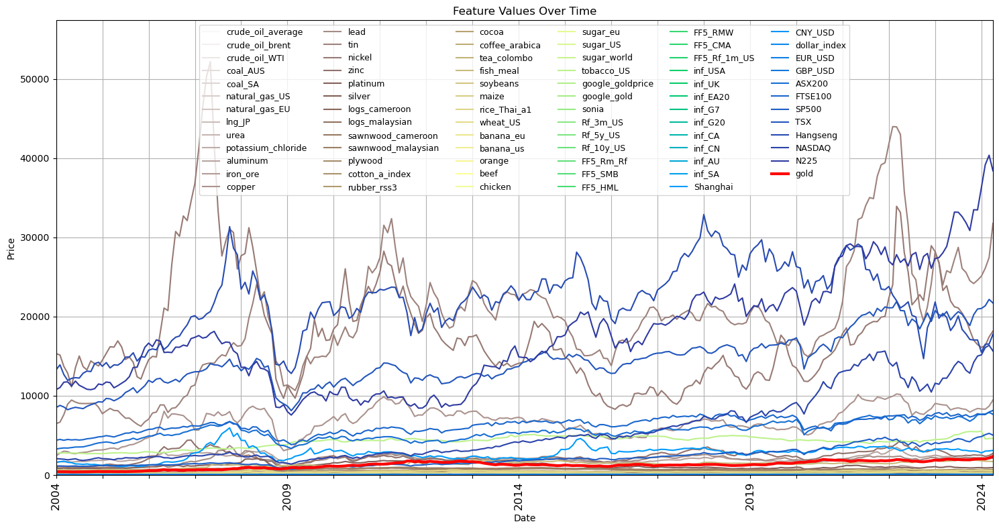

In [18]:
fig, ax = plt.subplots(figsize=(15, 8))
palette = sns.color_palette("terrain_r", len(price_data_df.columns))   

for i, col in enumerate(price_data_df.columns):
    if col != 'gold':
        price_data_df[col].plot(ax=ax, color=palette[i], legend=False)

price_data_df['gold'].plot(ax=ax, color='red', linewidth=3, legend=True)
ax.set_ylim([price_data_df.min().min(), price_data_df.max().max() * 1.1])

ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1), ncol=6, fontsize=9)

plt.xticks(rotation=90, fontsize=12, ticks=price_data_df.index[::12])

plt.grid()
plt.title('Feature Values Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.tight_layout()
plt.show()

In [19]:
# Normalise Date for Visualization
price_data_df_normalized = (price_data_df - price_data_df.mean()) / price_data_df.std()

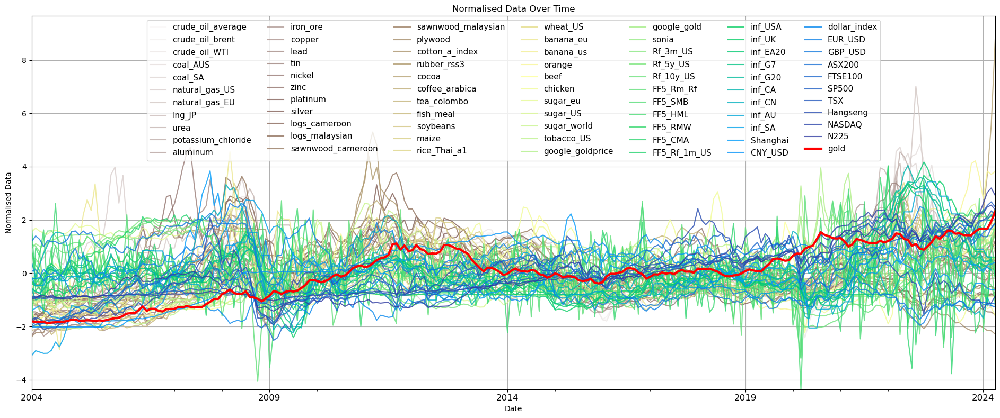

In [20]:
fig, ax = plt.subplots(figsize=(19, 8))
palette = sns.color_palette("terrain_r", len(price_data_df_normalized.columns))   

# Plot all columns except 'gold'
for i, col in enumerate(price_data_df_normalized.columns):
    if col != 'gold':
        price_data_df_normalized[col].plot(ax=ax, color=palette[i], legend=False, alpha=0.8)

# Plot 'gold' column on top of others
price_data_df_normalized['gold'].plot(ax=ax, color='red', linewidth=3, legend=True)

ax.set_ylim([price_data_df_normalized.min().min(), price_data_df_normalized.max().max() * 1.1])

ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1), ncol=7, fontsize=11)

plt.xticks(rotation=0, fontsize=12)

plt.grid()
plt.title('Normalised Data Over Time')
plt.xlabel('Date')
plt.ylabel('Normalised Data')
plt.tight_layout()
plt.show()

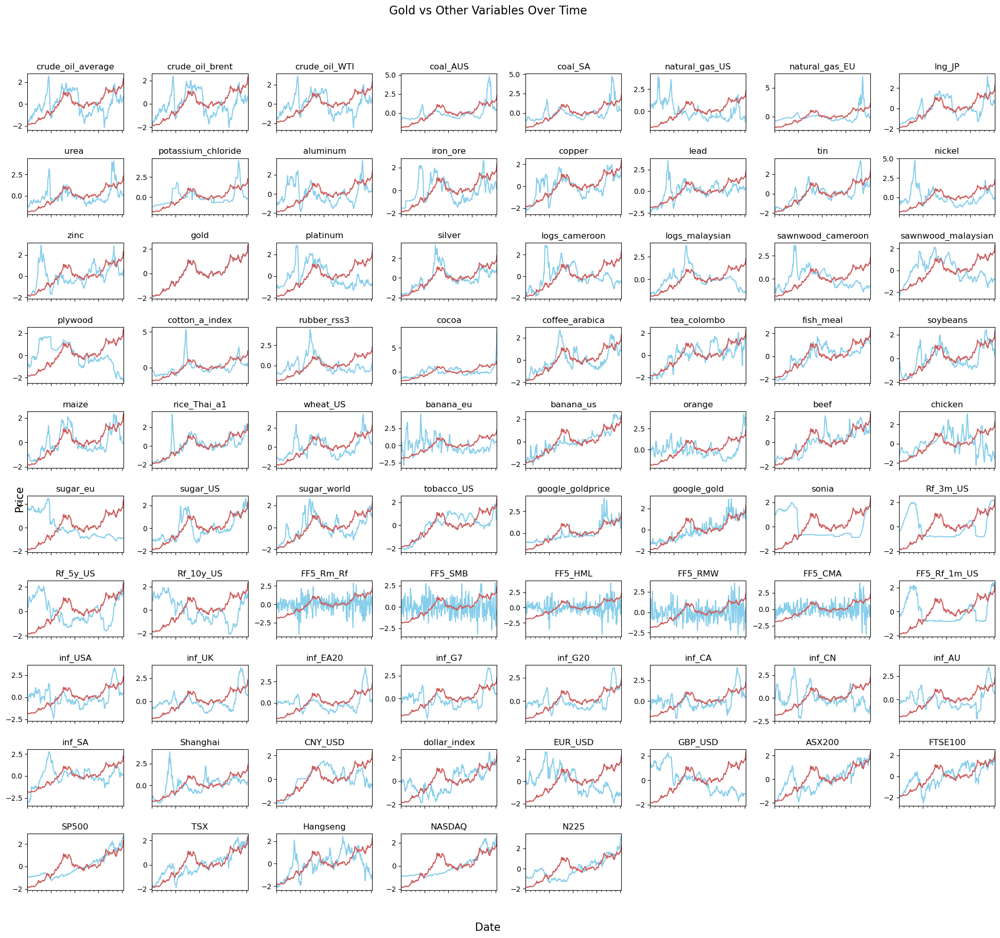

In [21]:
gold_price_series = price_data_df_normalized['gold']

fig, axes = plt.subplots(nrows=11, ncols=8, figsize=(20, 20), sharex=True)  
axes = axes.flatten()

for i, col in enumerate(price_data_df_normalized.columns):
        price_data_df_normalized[col].plot(ax=axes[i], title=col, legend=False, color='skyblue')
        gold_price_series.plot(ax=axes[i], legend=False, color='indianred', linestyle='-')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

for ax in axes:
    ax.set_xlabel('')
    ax.set_ylabel('')

fig.text(0.5, 0.08, 'Date', ha='center', fontsize=15)
fig.text(0.04, 0.5, 'Price', va='center', rotation='vertical', fontsize=15)

fig.suptitle('Gold vs Other Variables Over Time', fontsize=16)

plt.tight_layout(rect=[0.03, 0.03, 1, 0.95])
plt.subplots_adjust(hspace=0.5, wspace=0.3)

plt.show()

### Price Correlation

In [22]:
price_correlation_matrix = price_data_df_normalized.corr()

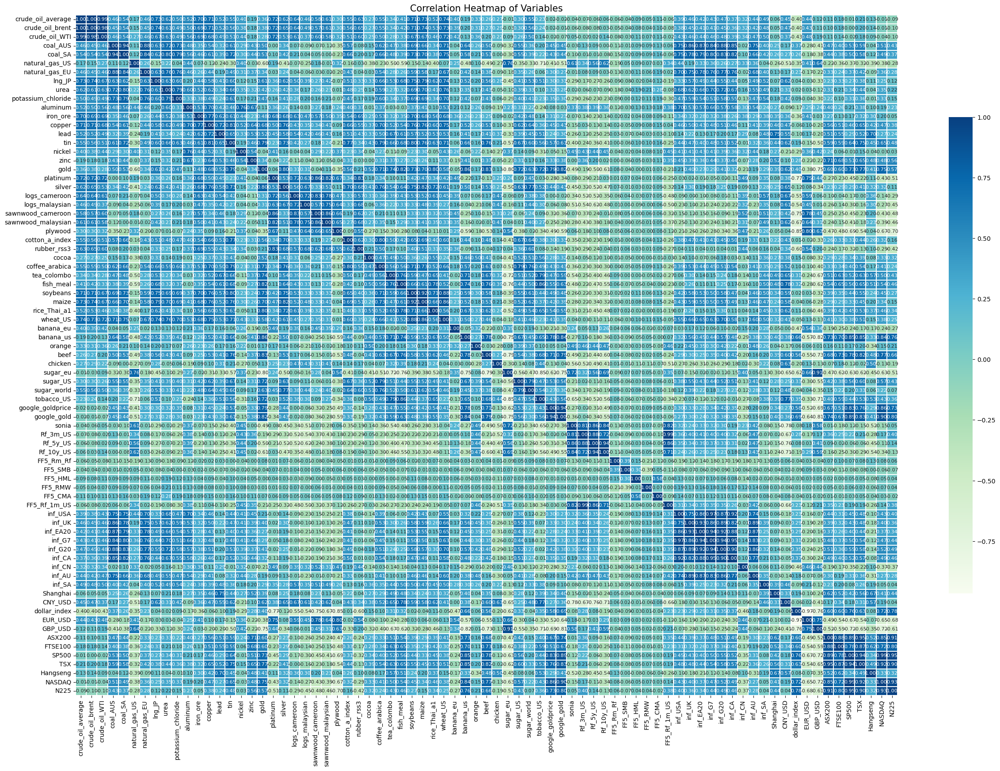

In [23]:
plt.figure(figsize=(30, 20))
sns.heatmap(price_correlation_matrix, annot=True, linewidths=0.2, annot_kws={"size": 8,}, cmap='GnBu', linecolor='white', cbar=True, fmt=".2f", cbar_kws={'shrink': .7})
plt.title('Correlation Heatmap of Variables', fontsize=15)
plt.show()

In [24]:
gold_correlations = price_correlation_matrix['gold'].drop('gold').sort_values(ascending=False)
price_positive_gold_correlations = gold_correlations.head(40)
price_negative_gold_correlations = gold_correlations.tail(16)

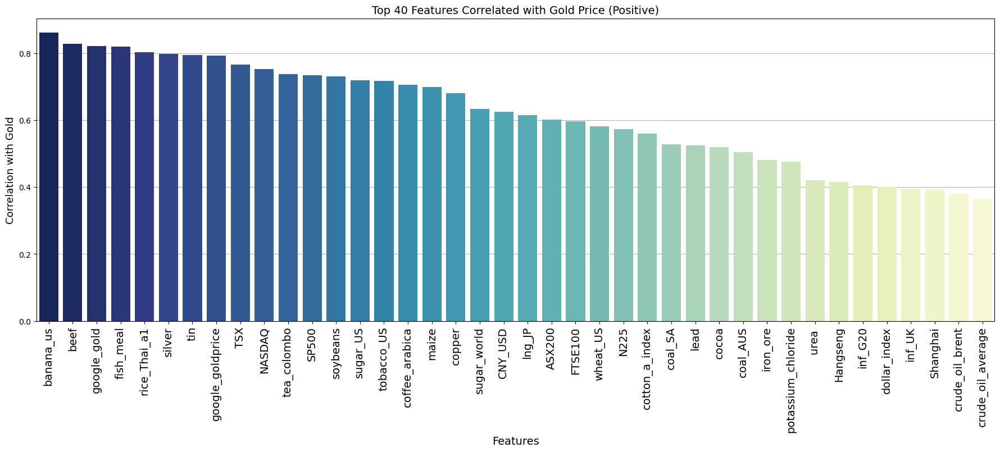

In [25]:
plt.figure(figsize=(22, 7))
sns.barplot(x=price_positive_gold_correlations.index, y=price_positive_gold_correlations.values, palette='YlGnBu_r')

plt.xlabel('Features', fontsize=14)
plt.ylabel('Correlation with Gold', fontsize=13)
plt.title('Top 40 Features Correlated with Gold Price (Positive)', fontsize=14)
plt.xticks(rotation=90, fontsize=14)
plt.grid(axis='y', linestyle='-', zorder=0)
plt.gca().set_axisbelow(True)

plt.show()

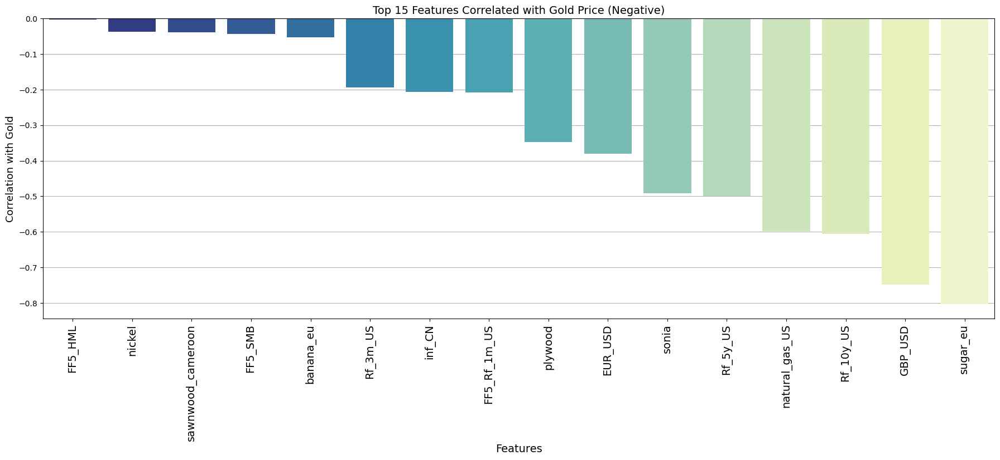

In [26]:
plt.figure(figsize=(22, 7))
sns.barplot(x=price_negative_gold_correlations.index, y=price_negative_gold_correlations.values, palette='YlGnBu_r')

plt.xlabel('Features', fontsize=14)
plt.ylabel('Correlation with Gold', fontsize=13)
plt.title('Top 15 Features Correlated with Gold Price (Negative)', fontsize=14)
plt.xticks(rotation=90, fontsize=14)
plt.grid(axis='y', linestyle='-', zorder=0)
plt.gca().set_axisbelow(True)

plt.show()


### Autocorrelation Analysis

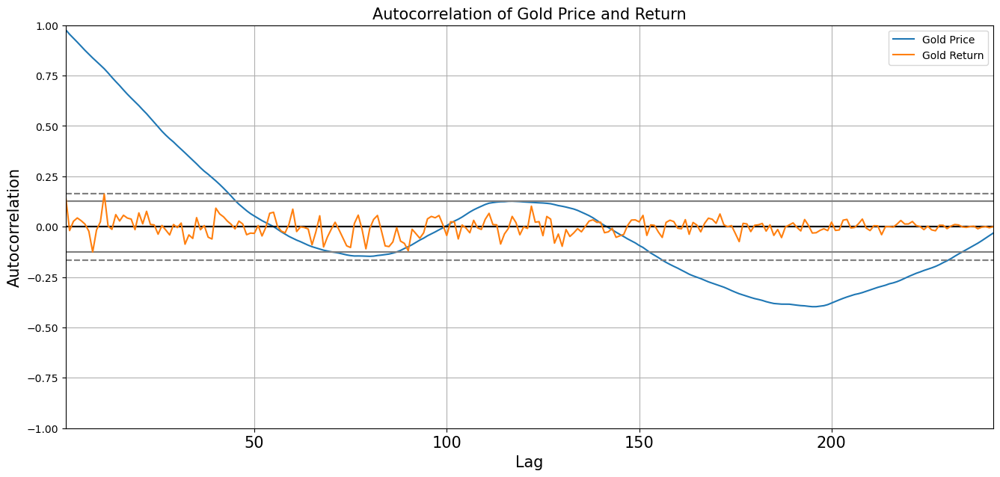

In [27]:
plt.figure(figsize=(16, 7))
autocorrelation_plot(price_data_df['gold'], label='Gold Price')
autocorrelation_plot(r_data_df['r_gold'], label='Gold Return')
plt.xlabel('Lag', size=15)
plt.ylabel('Autocorrelation', size=15)
plt.xticks(size=15)
plt.grid()
plt.legend()
plt.title('Autocorrelation of Gold Price and Return', size=15)
plt.show()

## Return Data 

### Return data time series (return features only)

In [28]:
r_data_df_r_only = r_data_df[r_commodity_df.columns.to_list() + r_index_df.columns.to_list()]
r_data_df_r_only

,r_crude_oil_average,r_crude_oil_brent,r_crude_oil_WTI,r_coal_AUS,r_coal_SA,r_natural_gas_US,r_natural_gas_EU,r_lng_JP,r_urea,r_potassium_chloride,...,r_sugar_world,r_tobacco_US,r_Shanghai,r_ASX200,r_FTSE100,r_SP500,r_TSX,r_Hangseng,r_NASDAQ,r_N225
2004-02,-0.001160,-0.009919,0.014217,0.105960,0.024242,-0.117358,0.005168,0.012632,-0.160686,0.000000,...,0.005164,0.004096,0.053018,0.027078,0.023117,0.012209,0.031345,0.046478,-0.017583,0.023954
2004-03,0.074486,0.095028,0.057625,0.172156,0.005917,0.003229,-0.007712,0.014553,-0.029740,0.000000,...,0.106165,-0.002036,0.039733,0.016277,-0.023708,-0.016359,-0.023053,-0.088111,-0.017538,0.060992
2004-04,0.001376,-0.012925,-0.000710,0.088123,0.111765,0.059229,0.015544,0.006148,-0.016284,0.000000,...,0.018576,-0.003122,-0.083851,-0.004246,0.023713,-0.016791,-0.039821,-0.058250,-0.037142,0.003961
2004-05,0.114101,0.136503,0.097527,0.059859,0.112434,0.108358,0.007653,0.000000,0.058617,0.000000,...,-0.036474,0.001591,-0.024869,0.017466,-0.013141,0.012083,0.021021,0.021375,0.034680,-0.044672
2004-06,-0.053655,-0.071868,-0.055953,0.055150,0.190012,-0.010158,0.015190,0.026477,0.164459,0.000000,...,0.093060,-0.000343,-0.100741,0.021010,0.007538,0.017989,0.015242,0.007174,0.030729,0.055400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11,-0.086765,-0.086513,-0.095127,-0.107656,-0.151090,-0.093756,-0.005797,0.008203,-0.062910,-0.029250,...,0.013997,-0.002352,0.003611,0.045217,0.018042,0.089179,0.072207,-0.004067,0.106992,0.085163
2023-12,-0.069265,-0.064015,-0.069095,0.118278,-0.001565,-0.067161,-0.205619,0.134880,-0.081712,-0.060263,...,-0.168328,-0.002464,-0.018067,0.071043,0.037484,0.044229,0.035683,0.000265,0.055189,-0.000678
2024-01,0.025793,0.030427,0.025666,-0.119306,-0.019107,0.258896,-0.169210,-0.006606,-0.052599,-0.050115,...,0.013370,0.013195,-0.062652,0.011843,-0.013267,0.015896,0.003030,-0.091646,0.010170,0.084345
2024-02,0.037023,0.044087,0.037468,-0.005444,-0.014585,-0.458876,-0.147624,-0.048742,0.047319,-0.023190,...,0.035032,-0.177607,0.081269,0.002344,-0.000079,0.051721,0.016254,0.066281,0.061192,0.079354


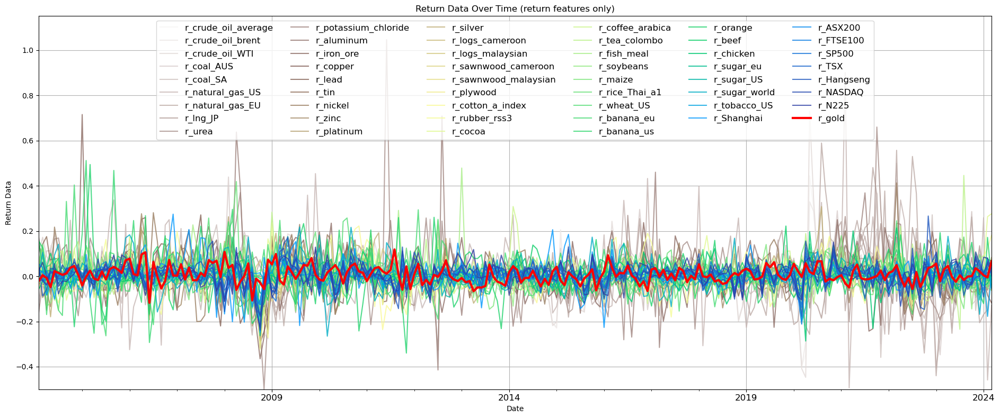

In [29]:
fig, ax = plt.subplots(figsize=(19, 8))
palette = sns.color_palette("terrain_r", len(r_data_df_r_only.columns))   

# Plot each column with the corresponding color from the palette
for i, col in enumerate(r_data_df_r_only.columns):
    if col != 'r_gold':
        r_data_df_r_only[col].plot(ax=ax, color=palette[i], legend=False,alpha=0.8)

r_data_df_r_only['r_gold'].plot(ax=ax, color='red', linewidth=3, legend=True)

ax.set_ylim([r_data_df_r_only.min().min(), r_data_df_r_only.max().max() * 1.1])

ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1), ncol=6, fontsize=12)

plt.xticks(rotation=0, fontsize=12)

plt.grid()
plt.title('Return Data Over Time (return features only)')
plt.xlabel('Date')
plt.ylabel('Return Data')
plt.tight_layout()
plt.show()

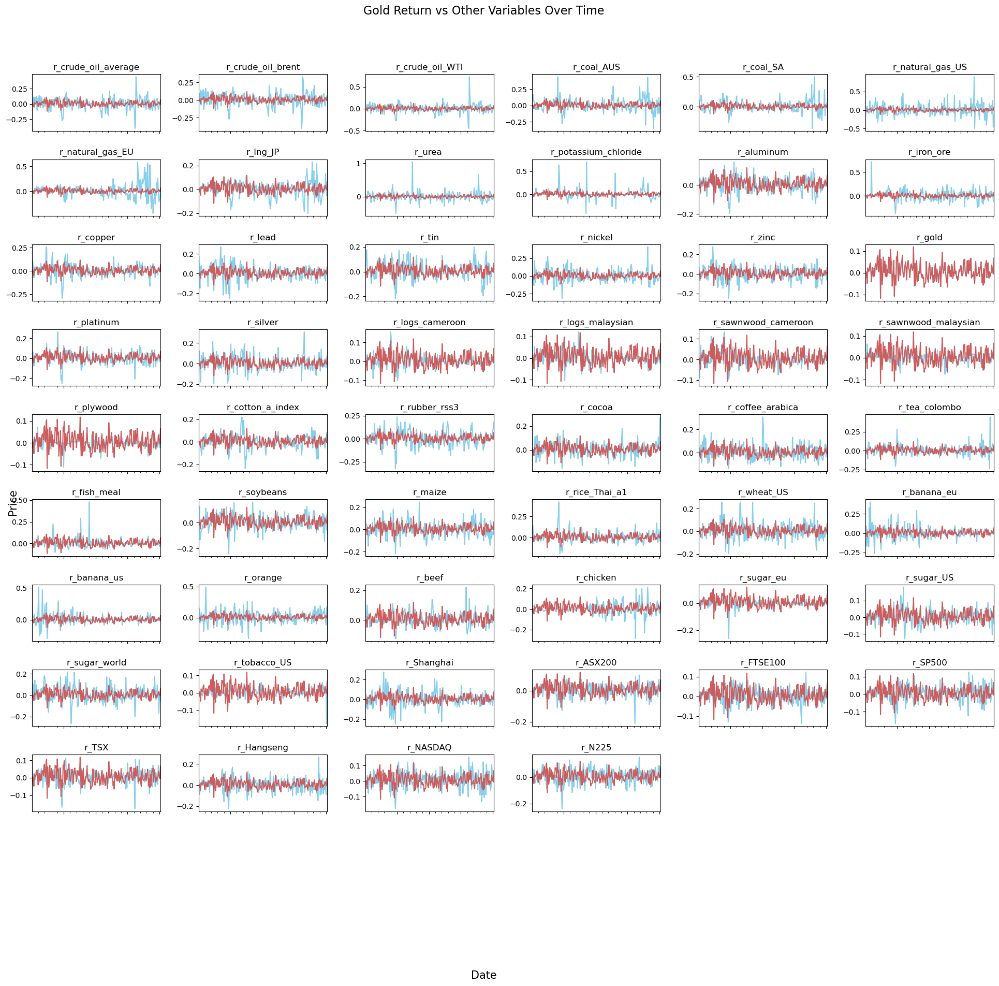

In [30]:
gold = r_data_df_r_only['r_gold']

fig, axes = plt.subplots(nrows=11, ncols=6, figsize=(20, 20), sharex=True)  
axes = axes.flatten()

for i, col in enumerate(r_data_df_r_only.columns):
        r_data_df_r_only[col].plot(ax=axes[i], title=col, legend=False, color='skyblue')
        gold.plot(ax=axes[i], legend=False, color='indianred', linestyle='-')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

for ax in axes:
    ax.set_xlabel('')
    ax.set_ylabel('')

fig.text(0.5, 0.04, 'Date', ha='center', fontsize=15)
fig.text(0.04, 0.5, 'Price', va='center', rotation='vertical', fontsize=15)

fig.suptitle('Gold Return vs Other Variables Over Time', fontsize=16)

plt.tight_layout(rect=[0.03, 0.03, 1, 0.95])
plt.subplots_adjust(hspace=0.5, wspace=0.3)

plt.show()

### Annual Volatility of Return (return features + other features)

In [31]:
r_data_df_for_volatility = r_data_df.copy()
annual_volatility = r_data_df_for_volatility.resample('Y').std()
annual_volatility.index = annual_volatility.index.to_timestamp()

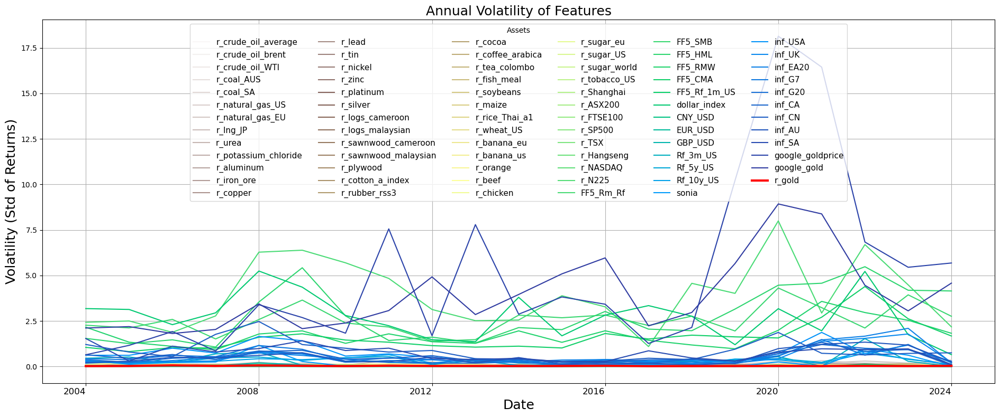

In [32]:
fig, ax = plt.subplots(figsize=(19, 8))  
palette = sns.color_palette("terrain_r", len(annual_volatility.columns))

# Plot each column with the corresponding color from the palette
for i, col in enumerate(annual_volatility.columns):
    if col != 'r_gold':
        ax.plot(annual_volatility.index, annual_volatility[col], linestyle='-', label=col, color=palette[i])
annual_volatility['r_gold'].plot(ax=ax, color='red', linewidth=3, legend=True)

plt.title('Annual Volatility of Features', fontsize=18)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Volatility (Std of Returns)', fontsize=18)
# plt.ylim(0,10)
plt.xticks(rotation=0, fontsize=12) 

plt.grid(True)

ax.legend(title='Assets', bbox_to_anchor=(0.5, 1), ncol=6, fontsize=11, loc='upper center')

plt.tight_layout()

plt.show()

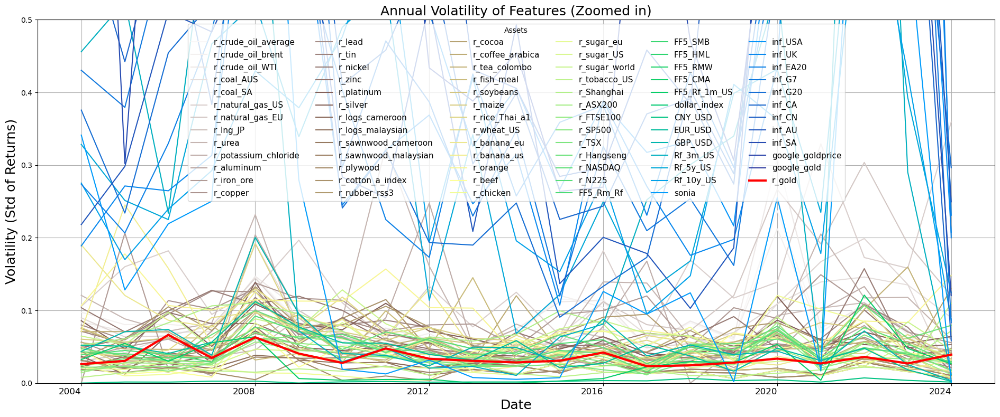

In [33]:
fig, ax = plt.subplots(figsize=(19, 8))  
palette = sns.color_palette("terrain_r", len(annual_volatility.columns))

# Plot each column with the corresponding color from the palette
for i, col in enumerate(annual_volatility.columns):
    if col != 'r_gold':
        ax.plot(annual_volatility.index, annual_volatility[col], linestyle='-', label=col, color=palette[i])
annual_volatility['r_gold'].plot(ax=ax, color='red', linewidth=3, legend=True)

plt.title('Annual Volatility of Features (Zoomed in)', fontsize=18)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Volatility (Std of Returns)', fontsize=18)
plt.ylim(0,0.5)
plt.xticks(rotation=0, fontsize=12)  

plt.grid(True)

ax.legend(title='Assets', bbox_to_anchor=(0.5, 1), ncol=6, fontsize=11, loc='upper center')

plt.tight_layout()

plt.show()

### Return Correlation (return features + other features)

In [34]:
r_correlation_matrix = r_data_df.corr()

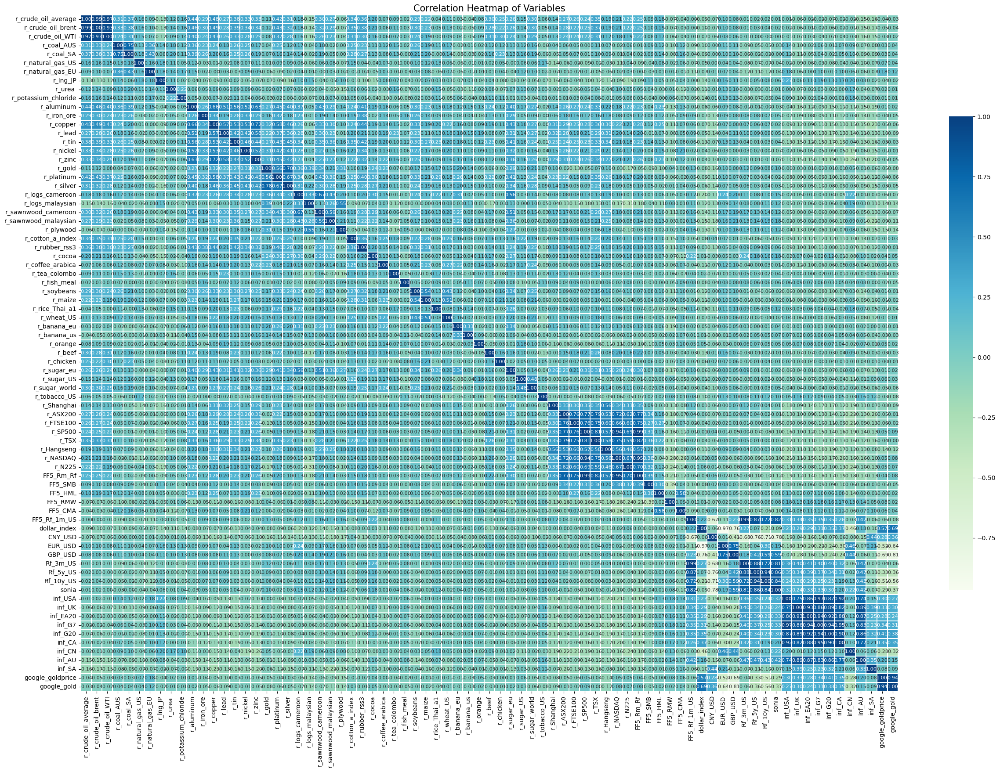

In [35]:
plt.figure(figsize=(30, 20))
sns.heatmap(r_correlation_matrix, annot=True, linewidths=0.2, annot_kws={"size": 8,}, cmap='GnBu', linecolor='white', cbar=True, fmt=".2f", cbar_kws={'shrink': .7})
plt.title('Correlation Heatmap of Variables', fontsize=15)
plt.show()

In [36]:
r_gold_correlations = r_correlation_matrix['r_gold'].drop('r_gold').sort_values(ascending=False)

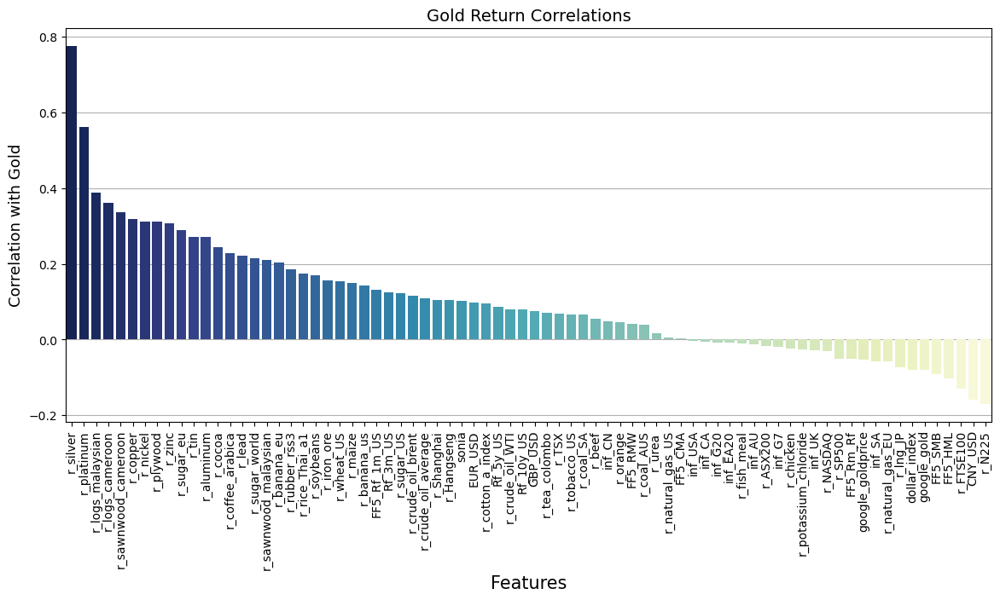

In [37]:
plt.figure(figsize=(14, 6))
sns.barplot(x=r_gold_correlations.index, y=r_gold_correlations.values, palette='YlGnBu_r')

plt.xlabel('Features', fontsize=15)
plt.ylabel('Correlation with Gold', fontsize=13)
plt.title('Gold Return Correlations', fontsize=14)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='-', zorder=0)
plt.gca().set_axisbelow(True)

plt.show()

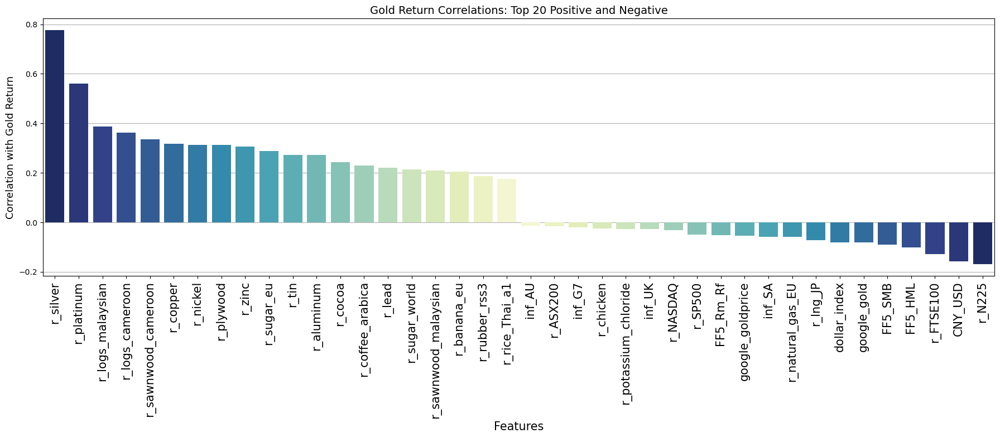

In [38]:
r_gold_correlations_top_20_positive = r_gold_correlations.head(20)
r_gold_correlations_bottom_20_negative = r_gold_correlations.tail(20)

# Combine the top 20 positive and bottom 20 negative correlations
r_gold_correlations_combined_correlations = pd.concat([r_gold_correlations_top_20_positive, r_gold_correlations_bottom_20_negative])

# Create the color palette for the bars
positive_colors = sns.color_palette('YlGnBu_r', n_colors=len(r_gold_correlations_top_20_positive))
negative_colors = sns.color_palette('YlGnBu', n_colors=len(r_gold_correlations_bottom_20_negative))

colors = positive_colors + negative_colors

plt.figure(figsize=(22, 6))
sns.barplot(x=r_gold_correlations_combined_correlations.index, y=r_gold_correlations_combined_correlations.values, palette=colors)

plt.xlabel('Features', fontsize=15)
plt.ylabel('Correlation with Gold Return', fontsize=13)
plt.title('Gold Return Correlations: Top 20 Positive and Negative', fontsize=14)

plt.xticks(rotation=90, fontsize=15)

plt.grid(axis='y', linestyle='-', zorder=0)
plt.gca().set_axisbelow(True)

plt.show()

# Data Preprocessing 

In [39]:
# target variable is gold return in one month ahead, we named it r_gold_forward_1
r_data_df['r_gold_forward_1'] = r_data_df['r_gold'].shift(-1)
r_data_df[['r_gold','r_gold_forward_1']]
r_data_df = r_data_df.dropna()

In [40]:
r_data_df = r_data_df.reset_index()
r_data_df = r_data_df.rename(columns={'index': 'date'})
r_data_df

,date,r_crude_oil_average,r_crude_oil_brent,r_crude_oil_WTI,r_coal_AUS,r_coal_SA,r_natural_gas_US,r_natural_gas_EU,r_lng_JP,r_urea,...,inf_EA20,inf_G7,inf_G20,inf_CA,inf_CN,inf_AU,inf_SA,google_goldprice,google_gold,r_gold_forward_1
0,2004-02,-0.001160,-0.009919,0.014217,0.105960,0.024242,-0.117358,0.005168,0.012632,-0.160686,...,1.7,1.378622,2.504390,0.680934,2.1,2.035623,-1.586527,4.0,44.0,0.004419
1,2004-03,0.074486,0.095028,0.057625,0.172156,0.005917,0.003229,-0.007712,0.014553,-0.029740,...,1.7,1.393859,2.450568,0.775946,3.0,2.035623,-1.698617,4.0,41.0,-0.008378
2,2004-04,0.001376,-0.012925,-0.000710,0.088123,0.111765,0.059229,0.015544,0.006148,-0.016284,...,2.1,1.759543,2.647136,1.660156,3.8,2.035623,-1.815761,4.0,44.0,-0.048309
3,2004-05,0.114101,0.136503,0.097527,0.059859,0.112434,0.108358,0.007653,0.000000,0.058617,...,2.5,2.289104,3.079801,2.439024,4.4,2.544529,-1.803656,4.0,43.0,0.022393
4,2004-06,-0.053655,-0.071868,-0.055953,0.055150,0.190012,-0.010158,0.015190,0.026477,0.164459,...,2.4,2.447706,3.280962,2.536585,5.0,2.544529,-1.540141,3.0,43.0,0.014573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,2023-10,-0.034009,-0.031266,-0.044764,-0.125254,0.285929,0.132260,0.261506,0.033515,0.082579,...,2.9,3.348952,5.681615,3.120936,-0.2,5.373832,6.091846,69.0,87.0,0.035413
237,2023-11,-0.086765,-0.086513,-0.095127,-0.107656,-0.151090,-0.093756,-0.005797,0.008203,-0.062910,...,2.4,3.065391,5.773999,3.116883,-0.5,4.051988,5.602241,53.0,82.0,0.021203
238,2023-12,-0.069265,-0.064015,-0.069095,0.118278,-0.001565,-0.067161,-0.205619,0.134880,-0.081712,...,2.9,3.231084,6.520217,3.396473,-0.3,4.051988,5.209302,54.0,82.0,0.003879
239,2024-01,0.025793,0.030427,0.025666,-0.119306,-0.019107,0.258896,-0.169210,-0.006606,-0.052599,...,2.8,2.914917,6.369981,2.858999,-0.8,4.051988,5.400373,45.0,83.0,-0.005310


# Predictive modelling  

#### Define Data Utility Functions for all models

In [41]:
def add_months(sourcedate, months) -> datetime.date:
    '''
    Add months to a datetime object
    '''
    month = sourcedate.month - 1 + months
    year = sourcedate.year + month // 12
    month = month % 12 + 1
    return datetime.date(year, month, 1)

def format_year_month(datetime_obj) -> str:
    '''
    takes datetime object and returns a string in the format 'YYYY-MM'
    '''
    return f'{datetime_obj.year}-{datetime_obj.month}'

In [42]:
def generate_monthly_expanding_dataset(
    data_df,
    i_th_month = 48,
    train_month_span = 12,
    val_month_span = 1,
    test_month_span = 1,
    target_column = 'r_gold_forward_1',
    columns_to_drop = ["r_gold_forward_1", "date"],
    verbose=False,
    reshape_y=True,
    scaling=False):

    data_min_date = r_data_df['date'].min()
    train_start_year = data_min_date.year
    month = data_min_date.month

    train_start_time = datetime.date(train_start_year, month, 1)
    train_end_time = add_months(train_start_time, (i_th_month+train_month_span))
    val_end_time = add_months(train_end_time, val_month_span)
    test_end_time = add_months(val_end_time, test_month_span)

    train_df = data_df[(data_df['date'] >= format_year_month(train_start_time)) & (data_df['date'] < format_year_month(train_end_time))]
    val_df = data_df[(data_df['date'] >= format_year_month(train_end_time)) & (data_df['date'] < format_year_month(val_end_time))]
    test_df = data_df[(data_df['date'] >= format_year_month(val_end_time)) & (data_df['date'] < format_year_month(test_end_time))]

    X_train = train_df.drop(columns=columns_to_drop)
    y_train = train_df[target_column]

    X_val = val_df.drop(columns=columns_to_drop)
    y_val = val_df[target_column]

    X_test = test_df.drop(columns=columns_to_drop)
    y_test = test_df[target_column]
    
    if scaling:
            scaler = StandardScaler()
            X_train_scaled = scaler.fit_transform(X_train)
            X_val_scaled = scaler.transform(X_val)
            X_test_scaled = scaler.transform(X_test)

    if verbose:
        print(f"train_start_time: {train_start_time}, train_end_time: {train_end_time}")
        print(f"val_start_time: {train_end_time}, val_end_time: {val_end_time}")
        print(f"test_start_time: {val_end_time}, test_end_time: {test_end_time}")

    meta_data_dict = {
        'train_start_time': train_start_time,
        'train_end_time': train_end_time,
        'val_start_time': train_end_time,
        'val_end_time': val_end_time,
        'test_start_time': val_end_time,
        'test_end_time': test_end_time
        }
    
    if reshape_y:
        # reshape y to 2D (N,1) for pytorch 
        if scaling:
            scaler = StandardScaler()
            X_train_scaled = scaler.fit_transform(X_train)
            X_val_scaled = scaler.transform(X_val)
            X_test_scaled = scaler.transform(X_test)
            return X_train_scaled, y_train.values.reshape(-1, 1), X_val_scaled, y_val.values.reshape(-1, 1), X_test_scaled, y_test.values.reshape(-1, 1), meta_data_dict
        else:
            return X_train.values, y_train.values.reshape(-1, 1), X_val.values, y_val.values.reshape(-1, 1), X_test.values, y_test.values.reshape(-1, 1), meta_data_dict
    else:
        if scaling:
            scaler = StandardScaler()
            X_train_scaled = scaler.fit_transform(X_train)
            X_val_scaled = scaler.transform(X_val)
            X_test_scaled = scaler.transform(X_test)
            return X_train_scaled, y_train.values, X_val_scaled, y_val.values, X_test_scaled, y_test.values, meta_data_dict
        else:
            return X_train.values, y_train.values, X_val.values, y_val.values, X_test.values, y_test.values, meta_data_dict

## Neural Network

#### Define Utility Functions and LSTM models

In [43]:
# rolling window dataset for fixed sequence length LSTM
class RollingWindowDataset(Dataset):
    def __init__(self, X, y, window_size):
        self.X = X
        self.y = y
        self.window_size = window_size

    def __len__(self):
        return len(self.X) - self.window_size + 1

    def __getitem__(self, idx):
        X_window = self.X[idx:idx + self.window_size]
        y_target = self.y[idx]  # Predict the y at the start of the window
        # print(f'Index: {idx}, X_window shape: {X_window.shape}, y_target shape: {y_target.shape}')  # debug statement
        return X_window, y_target

In [44]:
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, batch_size, num_layers=1, bias=True, batch_first=True, fc_layer=True, fc_activation = 'Tanh', dropout=0.0, bidirectional=False):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.bias = bias
        self.fc_layer = fc_layer
        self.batch_size = batch_size
        if fc_activation == 'Relu':
            self.activation_fc = nn.ReLU() 
        if fc_activation == 'Tanh':
            self.activation_fc = nn.Tanh()
        self.LSTM_layer_dropout_rate = dropout if num_layers > 1 else 0.0

        self.lstm = nn.LSTM(
            input_size, hidden_size, num_layers,
            batch_first=batch_first, bias=bias,
            dropout=self.LSTM_layer_dropout_rate, bidirectional=bidirectional
        )
        if fc_layer:
            self.fc = nn.Linear(hidden_size, hidden_size // 2) # fc hidden size = half of lstm hidden size
            self.fc_out = nn.Linear(hidden_size // 2, output_size)
        else:
            self.fc_out = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # Initialize hidden and cell states
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        lstm_output, _ = self.lstm(x, (h0, c0))
        if self.fc_layer:
            fc = self.activation_fc(self.fc(lstm_output[:, -1, :]))
            final_output = self.fc_out(fc)
        else:
            final_output = self.fc_out(lstm_output[:, -1, :])
        return final_output

In [45]:
class LSTM_expanding_seq(nn.Module):
    def __init__(self, input_size, hidden_size, output_size,num_layers=1, bias=True, fc_layer=True, fc_activation = 'Tanh', dropout=0.0, bidirectional=False):
        super(LSTM_expanding_seq, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.bias = bias
        self.fc_layer = fc_layer
        if fc_activation == 'Relu':
            self.activation_fc = nn.ReLU() 
        if fc_activation == 'Tanh':
            self.activation_fc = nn.Tanh()
        self.LSTM_layer_dropout_rate = dropout if num_layers > 1 else 0.0

        self.lstm = nn.LSTM(
            input_size, hidden_size, num_layers, bias=bias,
            dropout=self.LSTM_layer_dropout_rate, bidirectional=bidirectional
        )
        if fc_layer:
            self.fc = nn.Linear(hidden_size, hidden_size // 2) # fc hidden size = half of lstm hidden size
            self.fc_out = nn.Linear(hidden_size // 2, output_size)
        else:
            self.fc_out = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, self.hidden_size).to(x.device)

        lstm_output, _ = self.lstm(x, (h0, c0))
        if self.fc_layer:
            fc = self.activation_fc(self.fc(lstm_output[-1, :]))
            final_output = self.fc_out(fc)
        else:
            final_output = self.fc_out(lstm_output[-1, :])
        return final_output

In [46]:
def prepare_monthly_expanding_dataset_for_LSTM_fixed_seq_training(
    data_df,
    batch_size=2,
    i_th_month = 0,
    LSTM_seq_len = 12,
    train_month_span = 12,
    val_month_span = 1,
    test_month_span = 1,
    target_column = 'r_gold_forward_1',
    columns_to_drop = ["r_gold_forward_1", "date"],
    data_loader_workers=0,
    verbose=False,
    scaling=True
):
    '''
    Prepare data for single period look ahead LSTM training
    '''
    if train_month_span % LSTM_seq_len != 0 :
        raise ValueError(f"train_month_span must be multiples of {LSTM_seq_len}")
    if val_month_span != 1 or test_month_span != 1:
        raise ValueError(f"val_month_span and test_month_span must be 1 for single period look ahead LSTM training")

    X_train, y_train, X_val, y_val, X_test, y_test, meta_data_dict = (
        generate_monthly_expanding_dataset(
            data_df,
            i_th_month=i_th_month,
            train_month_span=train_month_span,
            val_month_span=val_month_span,
            test_month_span=test_month_span,
            target_column=target_column,
            columns_to_drop=columns_to_drop,
            verbose=verbose,
            reshape_y=True,
            scaling=scaling
        )
    )

    X_train = torch.tensor(X_train, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.float32)
    X_val = torch.tensor(X_val, dtype=torch.float32)
    y_val = torch.tensor(y_val, dtype=torch.float32)
    X_test = torch.tensor(X_test, dtype=torch.float32)
    y_test = torch.tensor(y_test, dtype=torch.float32)

    train_dataset = RollingWindowDataset(X_train, y_train, LSTM_seq_len)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=data_loader_workers)

    # since using batched training, adjust dimension of validation and test data
    X_val = X_val.view(1, 1, X_val.shape[1])
    X_test = X_test.view(1, 1, X_test.shape[1])

    return train_loader, X_val, y_val, X_test, y_test, meta_data_dict

In [47]:
def prepare_monthly_expanding_dataset_for_LSTM_expanding_seq_training(
    data_df,
    i_th_month = 0,
    train_month_span = 12,
    val_month_span = 1,
    test_month_span = 1,
    target_column = 'r_gold_forward_1',
    columns_to_drop = ["r_gold_forward_1", "date"],
    verbose=False,
    scaling=True
):
    '''
    Prepare data for single period look ahead LSTM training
    '''
    if val_month_span != 1 or test_month_span != 1:
        raise ValueError(f"val_month_span and test_month_span must be 1 for single period look ahead LSTM training")

    X_train, y_train, X_val, y_val, X_test, y_test, meta_data_dict = (
        generate_monthly_expanding_dataset(
            data_df,
            i_th_month=i_th_month,
            train_month_span=train_month_span,
            val_month_span=val_month_span,
            test_month_span=test_month_span,
            target_column=target_column,
            columns_to_drop=columns_to_drop,
            verbose=verbose,
            reshape_y=True,
            scaling=scaling
        )
    )

    X_train = torch.tensor(X_train, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.float32)
    X_val = torch.tensor(X_val, dtype=torch.float32)
    y_val = torch.tensor(y_val, dtype=torch.float32).view(1)
    X_test = torch.tensor(X_test, dtype=torch.float32)
    y_test = torch.tensor(y_test, dtype=torch.float32).view(1)

    return X_train, y_train, X_val, y_val, X_test, y_test, meta_data_dict

In [48]:
def single_period_trainer(model, optimizer, criterion, num_epochs, patience, train_loader, X_val, y_val, X_test, y_test, device, verbose=False):
    best_model_eval_loss = float('inf')
    best_model_state_dict = None
    best_model = None
    best_model_pred = None
    patience_counter = 0
    for epoch in range(num_epochs):
        model.train() # set model to training mode
        epoch_train_loss = 0.0
        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            loss.backward()
            optimizer.step()
            epoch_train_loss += loss.item() * inputs.size(0)
        epoch_train_loss /= len(train_loader.dataset)

        epoch_eval_loss = 0.0
        model.eval() # set model to evaluation mode
        with torch.no_grad(): # disable gradient calculation for efficiency
            X_val, y_val = X_val.to(device), y_val.to(device)
            y_pred_val = model(X_val)
            eval_loss = criterion(y_pred_val, y_val)
        epoch_eval_loss = eval_loss

        if epoch_eval_loss < best_model_eval_loss:
            best_model_eval_loss = epoch_eval_loss
            best_model_state_dict = model.state_dict()
            best_model = model
            best_model_pred = y_pred_val
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                #print(f'Early stopping at epoch: {epoch}')
                break
        # print(f'Epoch {epoch}, Train Loss: {epoch_train_loss}, Eval Loss: {epoch_eval_loss}')
    
    best_model.eval()
    with torch.no_grad():
        X_test, y_test = X_test.to(device), y_test.to(device)
        best_model_y_pred_test = best_model(X_test)
        best_model_test_loss = criterion(best_model_y_pred_test, y_test).item()
    
    if verbose:
        print(f'Best Model Evaluation Loss: {best_model_eval_loss}, Test Loss: {best_model_test_loss}')

    return best_model_y_pred_test, best_model_eval_loss, best_model_test_loss, best_model_state_dict

In [49]:
def single_period_trainer_LSTM_expanding_seq(model, optimizer, criterion, num_epochs, patience, X_train, y_train, X_val, y_val, X_test, y_test, device, verbose=False):
    best_model_eval_loss = float('inf')
    best_model_state_dict = None
    best_model = None
    best_model_pred = None
    patience_counter = 0
    for epoch in range(num_epochs):
        model.train() # set model to training mode
        epoch_train_loss = 0.0

        inputs, targets = X_train.to(device), y_train[-1].to(device) # use the last target as the target for the sequence
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)

        loss.backward()
        optimizer.step()
        epoch_train_loss += loss.item() * inputs.size(0)

        epoch_eval_loss = 0.0
        model.eval() # set model to evaluation mode
        with torch.no_grad(): # disable gradient calculation for efficiency
            X_val, y_val = X_val.to(device), y_val.to(device)
            y_pred_val = model(X_val)
            eval_loss = criterion(y_pred_val, y_val)
        epoch_eval_loss = eval_loss

        if epoch_eval_loss < best_model_eval_loss:
            best_model_eval_loss = epoch_eval_loss
            best_model_state_dict = model.state_dict()
            best_model = model
            best_model_pred = y_pred_val
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                #print(f'Early stopping at epoch: {epoch}')
                break
        # print(f'Epoch {epoch}, Train Loss: {epoch_train_loss}, Eval Loss: {epoch_eval_loss}')
    
    best_model.eval()
    with torch.no_grad():
        X_test, y_test = X_test.to(device), y_test.to(device)
        best_model_y_pred_test = best_model(X_test)
        best_model_test_loss = criterion(best_model_y_pred_test, y_test).item()
    
    if verbose:
        print(f'Best Model Evaluation Loss: {best_model_eval_loss}, Test Loss: {best_model_test_loss}')

    return best_model_y_pred_test, best_model_eval_loss, best_model_test_loss, best_model_state_dict

In [50]:
def recursive_LSTM_trainer(
    data_df,
    performance_and_model_dict,
    config_search_space,
    month_range=30,
    training_verbose=False,
    LSTM_seq_len=12,
    train_month_span=12,
    val_month_span=1,
    test_month_span=1,
    target_column="r_gold_forward_1",
    columns_to_drop=["r_gold_forward_1", "date"],
    scaling=False
):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    for i_th_month in tqdm(range(0, month_range), total=month_range):
        best_config_eval_loss = float('inf') # search for best validation MSE instead of OOS MSE to mimic true out-of-sample environment
        
        for config in config_search_space:
            # unpack config_search_space from config
            seed = config["seed"]
            input_size = config["input_size"]
            output_size = config["output_size"]
            num_layers = config["num_layers"]
            hidden_size = config["hidden_size"]
            LSTM_dropout = config["LSTM_layer_dropout_rate"]
            LSTM_bias = config["LSTM_bias"]
            criterion_name = config["criterion"]
            optimizer_name = config["optimizer"]
            fc_layer = config["fc_layer"]
            fc_activation = config["fc_activation"]
            learning_rate = config["learning_rate"]
            weight_decay = config["weight_decay"]
            batch_size = config["batch_size"]
            num_epochs = config["num_epochs"]
            patience = config["patience"]

            torch.manual_seed(seed)
            torch.cuda.manual_seed(seed)
            train_loader, X_val, y_val, X_test, y_test, meta_data_dict = (
                prepare_monthly_expanding_dataset_for_LSTM_fixed_seq_training(
                    data_df,
                    batch_size=batch_size,
                    i_th_month=i_th_month,
                    LSTM_seq_len=LSTM_seq_len,
                    train_month_span=train_month_span,
                    val_month_span=val_month_span,
                    test_month_span=test_month_span,
                    target_column=target_column,
                    columns_to_drop=columns_to_drop,
                    data_loader_workers=0,
                    verbose=False,
                    scaling=scaling
                )
            )

            model = LSTM(input_size=input_size, output_size=output_size, num_layers=num_layers, batch_size=batch_size,
                        bias=LSTM_bias, dropout=LSTM_dropout, fc_layer=fc_layer, fc_activation=fc_activation, hidden_size=hidden_size).to(device)
            OptimizerClass = getattr(optim, optimizer_name)
            CriterionClass = getattr(nn, criterion_name)
            optimizer = OptimizerClass(model.parameters(), lr=learning_rate, weight_decay = weight_decay)
            criterion = CriterionClass()
            oos_year_month = format_year_month(meta_data_dict['test_start_time'])
            if training_verbose:
                print(f"Training model for OOS year: {oos_year_month}")
                print(f"Configs: {config}")
                # print(f"Model: {model}")
            best_model_y_pred_test, best_model_eval_loss, test_loss, best_model_state_dict = single_period_trainer(
                model, optimizer, criterion, num_epochs, patience, train_loader, X_val, y_val, X_test, y_test, device, verbose=training_verbose)

            if best_model_eval_loss < best_config_eval_loss:
                best_config_eval_loss = best_model_eval_loss
                best_config_test_loss = test_loss
                best_config_state_dict = best_model_state_dict
                best_config = config
                best_config_pred = best_model_y_pred_test
                actual_y_test = y_test

        performance_and_model_dict[oos_year_month] = {
            "best_config_eval_loss": best_config_eval_loss.item(),
            "best_config_state_dict":best_config_state_dict,
            "best_config": best_config,
            "best_config_pred": best_config_pred,
            "actual_y_test": actual_y_test,
            "best_config_test_loss": best_config_test_loss,
            "i_th_month": i_th_month}
        print(f'{oos_year_month} training completed')
    return performance_and_model_dict

In [51]:
def recursive_LSTM_expanding_seq_trainer(
    data_df,
    performance_and_model_dict,
    config_search_space,
    month_range=30,
    training_verbose=False,
    train_month_span=12,
    val_month_span=1,
    test_month_span=1,
    target_column="r_gold_forward_1",
    columns_to_drop=["r_gold_forward_1", "date"],
    scaling=False
):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    for i_th_month in tqdm(range(0, month_range), total=month_range):
        best_config_eval_loss = float('inf') # search for best validation MSE instead of OOS MSE to mimic true out-of-sample environment
        
        for config in config_search_space:
            # unpack config_search_space from config
            seed = config["seed"]
            input_size = config["input_size"]
            output_size = config["output_size"]
            num_layers = config["num_layers"]
            hidden_size = config["hidden_size"]
            LSTM_dropout = config["LSTM_layer_dropout_rate"]
            LSTM_bias = config["LSTM_bias"]
            criterion_name = config["criterion"]
            optimizer_name = config["optimizer"]
            fc_layer = config["fc_layer"]
            fc_activation = config["fc_activation"]
            learning_rate = config["learning_rate"]
            weight_decay = config["weight_decay"]
            num_epochs = config["num_epochs"]
            patience = config["patience"]

            torch.manual_seed(seed)
            torch.cuda.manual_seed(seed)
            
            X_train, y_train, X_val, y_val, X_test, y_test, meta_data_dict = (
                prepare_monthly_expanding_dataset_for_LSTM_expanding_seq_training(
                    data_df,
                    i_th_month=i_th_month,
                    train_month_span=train_month_span,
                    val_month_span=val_month_span,
                    test_month_span=test_month_span,
                    target_column=target_column,
                    columns_to_drop=columns_to_drop,
                    verbose=False,
                    scaling=scaling
                )
            )

            model = LSTM_expanding_seq(input_size=input_size, output_size=output_size, num_layers=num_layers, 
                        bias=LSTM_bias, dropout=LSTM_dropout, fc_layer=fc_layer, fc_activation=fc_activation, hidden_size=hidden_size).to(device)
            OptimizerClass = getattr(optim, optimizer_name)
            CriterionClass = getattr(nn, criterion_name)
            optimizer = OptimizerClass(model.parameters(), lr=learning_rate, weight_decay = weight_decay)
            criterion = CriterionClass()
            oos_year_month = format_year_month(meta_data_dict['test_start_time'])
            if training_verbose:
                print(f"Training model for OOS year: {oos_year_month}")
                print(f"Configs: {config}")
                # print(f"Model: {model}")
            best_model_y_pred_test, best_model_eval_loss, test_loss, best_model_state_dict = single_period_trainer_LSTM_expanding_seq(
                model, optimizer, criterion, num_epochs, patience, X_train, y_train, X_val, y_val, X_test, y_test, device, verbose=training_verbose)

            if best_model_eval_loss < best_config_eval_loss:
                best_config_eval_loss = best_model_eval_loss
                best_config_test_loss = test_loss
                best_config_state_dict = best_model_state_dict
                best_config = config
                best_config_pred = best_model_y_pred_test
                actual_y_test = y_test

        performance_and_model_dict[oos_year_month] = {
            "best_config_eval_loss": best_config_eval_loss.item(),
            "best_config_state_dict":best_config_state_dict,
            "best_config": best_config,
            "best_config_pred": best_config_pred,
            "actual_y_test": actual_y_test,
            "best_config_test_loss": best_config_test_loss,
            "i_th_month": i_th_month}
        print(f'{oos_year_month} training completed')
    return performance_and_model_dict

### LSTM fixed sequence length (expanding data generation + rolling window training)

#### LSTM fixed sequence length training

In [52]:
num_features = len(r_data_df.columns)-len(["r_gold_forward_1", "date"])

LSTM_fixed_seq_config_search_space_dict = {
    "seed": [9],
    "input_size": [num_features],
    "output_size": [1],
    "num_layers": [1, 2],
    "hidden_size": [256, 512],
    "LSTM_layer_dropout_rate": [0.0, 0.2],
    "LSTM_bias": [True, False],
    "criterion": ["MSELoss"],
    "optimizer": ["Adam"],
    "fc_layer": [True, False],
    "fc_activation": ["Relu"],
    "weight_decay": [0.01, 0.001],
    "learning_rate": [0.01, 0.001],
    "batch_size": [24],
    "num_epochs": [1500],
    "patience": [5],
}

LSTM_fixed_seq_config_search_space_dict_list = list(ParameterGrid(LSTM_fixed_seq_config_search_space_dict))
print(f'configuration search space size: {len(LSTM_fixed_seq_config_search_space_dict_list)}')

configuration search space size: 128


In [ ]:
LSTM_fixed_seq_performance_and_model_dict = {}
LSTM_fixed_seq_performance_and_model_dict = recursive_LSTM_trainer(
    r_data_df,
    LSTM_fixed_seq_performance_and_model_dict,
    LSTM_fixed_seq_config_search_space_dict_list,
    month_range = 241 - (12 + 1),
    training_verbose=False,
    LSTM_seq_len=12,
    train_month_span=12,
    val_month_span=1,
    test_month_span=1,
    target_column="r_gold_forward_1",
    columns_to_drop=["r_gold_forward_1", "date"],
    scaling=True
)
# model check point
# with open("LSTM_fixed_seq_performance_and_model_dict.pkl", "wb") as f:
#     pickle.dump(LSTM_fixed_seq_performance_and_model_dict, f)

In [53]:
# load check point if previously saved
# LSTM_fixed_seq_performance_and_model_dict = pickle.load(open("LSTM_fixed_seq_performance_and_model_dict.pkl", "rb"))

In [54]:
def create_LSTM_fixed_seq_performance_df(LSTM_fixed_seq_performance_and_model_dict) -> pd.DataFrame:
    # collect data from dictionary
    LSTM_fixed_seq_eval_loss_dict = {key: value["best_config_eval_loss"] for key, value in LSTM_fixed_seq_performance_and_model_dict.items()}
    LSTM_fixed_seq_pred_dict = {key: value["best_config_pred"].item() for key, value in LSTM_fixed_seq_performance_and_model_dict.items()}
    LSTM_fixed_seq_actual_y_dict = {key: value["actual_y_test"].item() for key, value in LSTM_fixed_seq_performance_and_model_dict.items()}
    LSTM_fixed_seq_test_loss_dict = {key: value["best_config_test_loss"] for key, value in LSTM_fixed_seq_performance_and_model_dict.items()}
    # format
    LSTM_fixed_seq_pred_df = pd.DataFrame(list(LSTM_fixed_seq_pred_dict.items()), columns=['date', 'LSTM_fixed_seq_pred']).sort_values(by='date', ascending=True)
    LSTM_fixed_seq_actual_y_df = pd.DataFrame(list(LSTM_fixed_seq_actual_y_dict.items()), columns=['date', 'actual_y']).sort_values(by='date', ascending=True)
    LSTM_fixed_seq_eval_MSE_df = pd.DataFrame(list(LSTM_fixed_seq_eval_loss_dict.items()), columns=['date', 'LSTM_fixed_seq_eval_MSE']).sort_values(by='date', ascending=True)
    LSTM_fixed_seq_test_MSE_df = pd.DataFrame(list(LSTM_fixed_seq_test_loss_dict.items()), columns=['date', 'LSTM_fixed_seq_test_MSE']).sort_values(by='date', ascending=True)
    # set index for merging
    LSTM_fixed_seq_pred_df.set_index('date', inplace=True)
    LSTM_fixed_seq_actual_y_df.set_index('date', inplace=True)
    LSTM_fixed_seq_eval_MSE_df.set_index('date', inplace=True)
    LSTM_fixed_seq_test_MSE_df.set_index('date', inplace=True)
    # concatenate dataframes
    LSTM_fixed_seq_performance_df =  pd.concat([
        LSTM_fixed_seq_pred_df,
        LSTM_fixed_seq_actual_y_df,
        LSTM_fixed_seq_eval_MSE_df,
        LSTM_fixed_seq_test_MSE_df],
        axis=1,).sort_index()
    LSTM_fixed_seq_performance_df.index = pd.to_datetime(LSTM_fixed_seq_performance_df.index)
    return LSTM_fixed_seq_performance_df

def performance_evaluation_LSTM_fixed_seq(dataframe) -> pd.DataFrame:
    # Compute the signs of the predictions and actual values
    dataframe['pred_sign'] = dataframe['LSTM_fixed_seq_pred'].apply(lambda x: 'Positive' if x > 0 else 'Negative')
    dataframe['actual_sign'] = dataframe['actual_y'].apply(lambda x: 'Positive' if x > 0 else 'Negative')
    # Determine if the prediction sign matches the actual sign
    dataframe['correct_sign_bool'] = dataframe['pred_sign'] == dataframe['actual_sign']
    # Convert the boolean correctness to numeric form (1 for correct, -1 for incorrect)
    dataframe['correct_sign_numeric'] = dataframe['correct_sign_bool'].apply(lambda x: 1 if x else -1)
    # Calculate a the simple long-short return based on sign prediction 
    # gain if correct sign, lost if incorrect sign
    dataframe['simple_long_short_return_on_prediction'] = dataframe['correct_sign_numeric'] * abs(dataframe['actual_y'])
    # create new column called buy and hold return
    dataframe['buy_and_hold_return'] = dataframe['actual_y']
    dataframe
    # Accumulate the returns over time
    dataframe['cumulative_simple_long_short_return_on_prediction'] = (1 + dataframe['simple_long_short_return_on_prediction']).cumprod() - 1
    dataframe['cumulative_buy_and_hold_return'] = (1 + dataframe['buy_and_hold_return']).cumprod() - 1
    # Display results
    simple_long_short_return_on_prediction = dataframe['simple_long_short_return_on_prediction'].sum()
    buy_and_hold_return = dataframe['buy_and_hold_return'].sum()
    sign_prediction_accuracy = dataframe['correct_sign_bool'].mean()
    prediction_mse = mean_squared_error(dataframe['actual_y'], dataframe['LSTM_fixed_seq_pred'])
    print("Simple Long-Short Strategy Total Return: {:.2f}%".format(simple_long_short_return_on_prediction * 100))
    print("Buy and Hold Total Return: {:.2f}%".format(buy_and_hold_return * 100))
    print("Sign Prediction Accuracy: {:.2f}%".format(sign_prediction_accuracy * 100))

    return dataframe, simple_long_short_return_on_prediction, buy_and_hold_return, sign_prediction_accuracy, prediction_mse

In [55]:
LSTM_fixed_seq_performance_df = create_LSTM_fixed_seq_performance_df(LSTM_fixed_seq_performance_and_model_dict)
LSTM_fixed_seq_performance_df, LSTM_fixed_seq_simple_long_short_return_on_prediction, buy_and_hold_return, LSTM_fixed_seq_sign_prediction_accuracy, LSTM_fixed_seq_prediction_mse = performance_evaluation_LSTM_fixed_seq(LSTM_fixed_seq_performance_df)

Simple Long-Short Strategy Total Return: 222.59%
Buy and Hold Total Return: 177.22%
Sign Prediction Accuracy: 58.77%


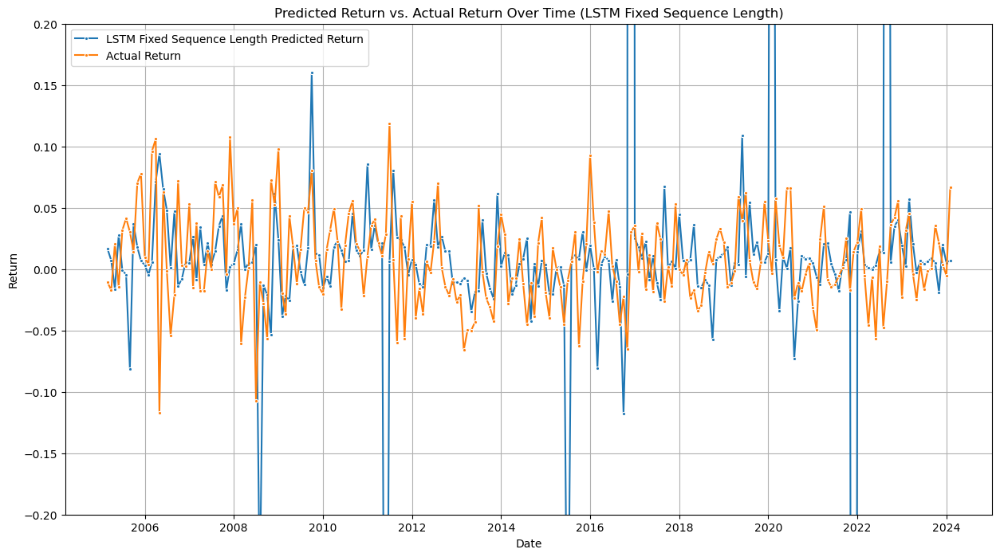

In [56]:
plt.figure(figsize=(15, 8))
sns.lineplot(data=LSTM_fixed_seq_performance_df, x='date', y='LSTM_fixed_seq_pred',label='LSTM Fixed Sequence Length Predicted Return', marker='.')
sns.lineplot(data=LSTM_fixed_seq_performance_df, x='date', y='actual_y', label='Actual Return', marker='.')
plt.title('Predicted Return vs. Actual Return Over Time (LSTM Fixed Sequence Length)')
plt.xlabel('Date')
plt.ylabel('Return')
plt.ylim(-0.2, 0.2)
plt.legend()
plt.grid()
plt.show()

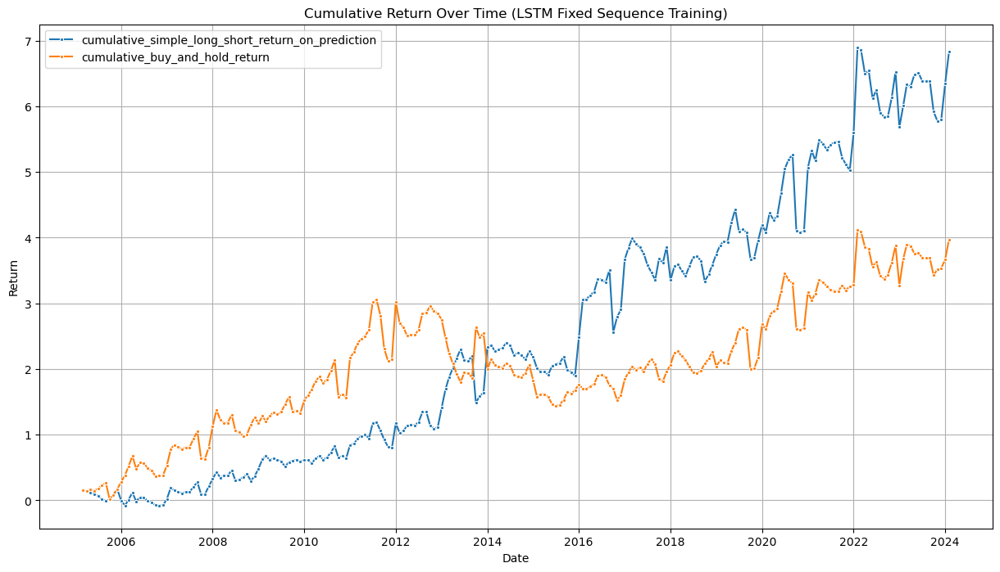

In [57]:
plt.figure(figsize=(15, 8))
sns.lineplot(data=LSTM_fixed_seq_performance_df, x='date', y='cumulative_simple_long_short_return_on_prediction',label='cumulative_simple_long_short_return_on_prediction', marker='.')
sns.lineplot(data=LSTM_fixed_seq_performance_df, x='date', y='cumulative_buy_and_hold_return', label='cumulative_buy_and_hold_return', marker='.')
plt.title('Cumulative Return Over Time (LSTM Fixed Sequence Training)')
plt.xlabel('Date')
plt.ylabel('Return')
plt.legend()
plt.grid()
plt.show()

### LSTM expanding sequence length (expanding data generation + expanding window training)

#### LSTM expanding sequence length training

In [164]:
num_features = len(r_data_df.columns)-len(["r_gold_forward_1", "date"])

LSTM_expanding_seq_config_search_space_dict = {
    "seed": [9],
    "input_size": [num_features],
    "output_size": [1],
    "num_layers": [1, 2],
    "hidden_size": [256, 512],
    "LSTM_layer_dropout_rate": [0.0, 0.2],
    "LSTM_bias": [True, False],
    "criterion": ["MSELoss"],
    "optimizer": ["Adam"],
    "fc_layer": [True, False],
    "fc_activation": ["Relu"],
    "weight_decay": [0.01, 0.001],
    "learning_rate": [0.01, 0.001],
    "num_epochs": [1500],
    "patience": [5],
}

LSTM_expanding_seq_config_search_space_dict_list = list(ParameterGrid(LSTM_expanding_seq_config_search_space_dict))
print(f'configuration search space size: {len(LSTM_expanding_seq_config_search_space_dict_list)}')

configuration search space size: 128


In [ ]:
LSTM_expanding_seq_performance_and_model_dict = {}
LSTM_expanding_seq_performance_and_model_dict = recursive_LSTM_expanding_seq_trainer(
    r_data_df,
    LSTM_expanding_seq_performance_and_model_dict,
    LSTM_expanding_seq_config_search_space_dict_list,
    month_range = 241 - (12 + 1),
    training_verbose=False,
    train_month_span=12,
    val_month_span=1,
    test_month_span=1,
    target_column="r_gold_forward_1",
    columns_to_drop=["r_gold_forward_1", "date"],
    scaling=True
)
# model check point
# with open("LSTM_expanding_seq_performance_and_model_dict.pkl", "wb") as f:
#     pickle.dump(LSTM_expanding_seq_performance_and_model_dict, f)

In [60]:
# load check point if previously saved
# LSTM_expanding_seq_performance_and_model_dict = pickle.load(open("LSTM_expanding_seq_performance_and_model_dict.pkl", "rb"))

In [61]:
def create_LSTM_expanding_seq_performance_df(LSTM_expanding_seq_performance_and_model_dict) -> pd.DataFrame:
    # collect data from dictionary
    LSTM_expanding_seq_eval_loss_dict = {key: value["best_config_eval_loss"] for key, value in LSTM_expanding_seq_performance_and_model_dict.items()}
    LSTM_expanding_seq_pred_dict = {key: value["best_config_pred"].item() for key, value in LSTM_expanding_seq_performance_and_model_dict.items()}
    LSTM_expanding_seq_actual_y_dict = {key: value["actual_y_test"].item() for key, value in LSTM_expanding_seq_performance_and_model_dict.items()}
    LSTM_expanding_seq_test_loss_dict = {key: value["best_config_test_loss"] for key, value in LSTM_expanding_seq_performance_and_model_dict.items()}
    # format
    LSTM_expanding_seq_pred_df = pd.DataFrame(list(LSTM_expanding_seq_pred_dict.items()), columns=['date', 'LSTM_expanding_seq_pred']).sort_values(by='date', ascending=True)
    LSTM_expanding_seq_actual_y_df = pd.DataFrame(list(LSTM_expanding_seq_actual_y_dict.items()), columns=['date', 'actual_y']).sort_values(by='date', ascending=True)
    LSTM_expanding_seq_eval_MSE_df = pd.DataFrame(list(LSTM_expanding_seq_eval_loss_dict.items()), columns=['date', 'LSTM_expanding_seq_eval_MSE']).sort_values(by='date', ascending=True)
    LSTM_expanding_seq_test_MSE_df = pd.DataFrame(list(LSTM_expanding_seq_test_loss_dict.items()), columns=['date', 'LSTM_expanding_seq_test_MSE']).sort_values(by='date', ascending=True)
    # set index for merging
    LSTM_expanding_seq_pred_df.set_index('date', inplace=True)
    LSTM_expanding_seq_actual_y_df.set_index('date', inplace=True)
    LSTM_expanding_seq_eval_MSE_df.set_index('date', inplace=True)
    LSTM_expanding_seq_test_MSE_df.set_index('date', inplace=True)
    # concatenate dataframes
    LSTM_expanding_seq_performance_df =  pd.concat([
        LSTM_expanding_seq_pred_df,
        LSTM_expanding_seq_actual_y_df,
        LSTM_expanding_seq_eval_MSE_df,
        LSTM_expanding_seq_test_MSE_df],
        axis=1,).sort_index()
    LSTM_expanding_seq_performance_df.index = pd.to_datetime(LSTM_expanding_seq_performance_df.index)
    return LSTM_expanding_seq_performance_df

def performance_evaluation_LSTM_expanding_seq(dataframe) -> pd.DataFrame:
    # Compute the signs of the predictions and actual values
    dataframe['pred_sign'] = dataframe['LSTM_expanding_seq_pred'].apply(lambda x: 'Positive' if x > 0 else 'Negative')
    dataframe['actual_sign'] = dataframe['actual_y'].apply(lambda x: 'Positive' if x > 0 else 'Negative')
    # Determine if the prediction sign matches the actual sign
    dataframe['correct_sign_bool'] = dataframe['pred_sign'] == dataframe['actual_sign']
    # Convert the boolean correctness to numeric form (1 for correct, -1 for incorrect)
    dataframe['correct_sign_numeric'] = dataframe['correct_sign_bool'].apply(lambda x: 1 if x else -1)
    # Calculate a the simple long-short return based on sign prediction 
    # gain if correct sign, lost if incorrect sign
    dataframe['simple_long_short_return_on_prediction'] = dataframe['correct_sign_numeric'] * abs(dataframe['actual_y'])
    # create new column called buy and hold return
    dataframe['buy_and_hold_return'] = dataframe['actual_y']
    dataframe
    # Accumulate the returns over time
    dataframe['cumulative_simple_long_short_return_on_prediction'] = (1 + dataframe['simple_long_short_return_on_prediction']).cumprod() - 1
    dataframe['cumulative_buy_and_hold_return'] = (1 + dataframe['buy_and_hold_return']).cumprod() - 1
    # Display results
    simple_long_short_return_on_prediction = dataframe['simple_long_short_return_on_prediction'].sum()
    buy_and_hold_return = dataframe['buy_and_hold_return'].sum()
    sign_prediction_accuracy = dataframe['correct_sign_bool'].mean()
    prediction_mse = mean_squared_error(dataframe['actual_y'], dataframe['LSTM_expanding_seq_pred'])
    print("Simple Long-Short Strategy Total Return: {:.2f}%".format(simple_long_short_return_on_prediction * 100))
    print("Buy and Hold Total Return: {:.2f}%".format(buy_and_hold_return * 100))
    print("Sign Prediction Accuracy: {:.2f}%".format(sign_prediction_accuracy * 100))

    return dataframe, simple_long_short_return_on_prediction, buy_and_hold_return, sign_prediction_accuracy, prediction_mse

In [62]:
LSTM_expanding_seq_performance_df = create_LSTM_expanding_seq_performance_df(LSTM_expanding_seq_performance_and_model_dict)
(LSTM_expanding_seq_performance_df,LSTM_expanding_seq_simple_long_short_return_on_prediction,buy_and_hold_return,LSTM_expanding_seq_sign_prediction_accuracy,LSTM_expanding_seq_prediction_mse) = performance_evaluation_LSTM_expanding_seq(LSTM_expanding_seq_performance_df)

Simple Long-Short Strategy Total Return: 182.50%
Buy and Hold Total Return: 177.22%
Sign Prediction Accuracy: 56.58%


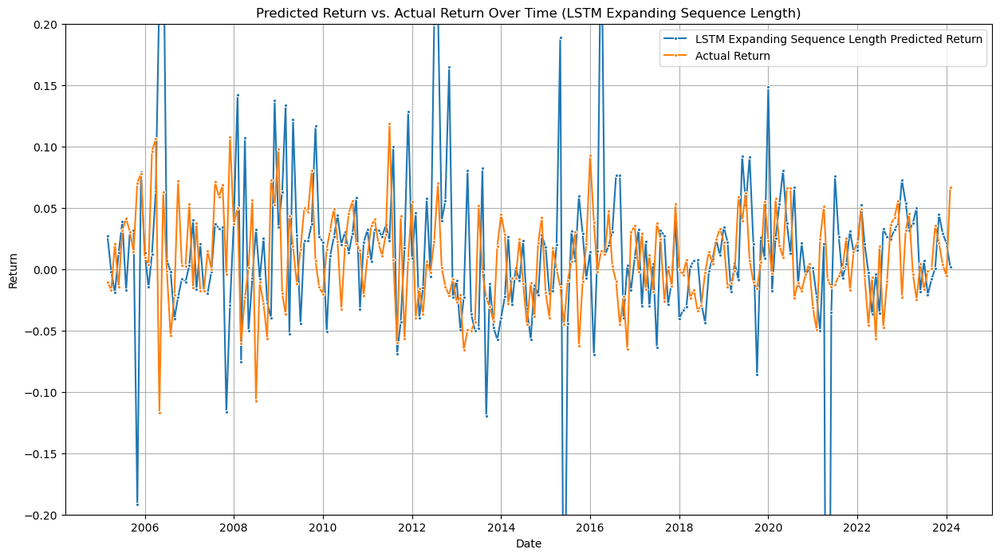

In [63]:
plt.figure(figsize=(15, 8))
sns.lineplot(data=LSTM_expanding_seq_performance_df, x='date', y='LSTM_expanding_seq_pred',label='LSTM Expanding Sequence Length Predicted Return', marker='.')
sns.lineplot(data=LSTM_expanding_seq_performance_df, x='date', y='actual_y', label='Actual Return', marker='.')
plt.title('Predicted Return vs. Actual Return Over Time (LSTM Expanding Sequence Length)')
plt.xlabel('Date')
plt.ylabel('Return')
plt.ylim(-0.2, 0.2)
plt.legend()
plt.grid()
plt.show()

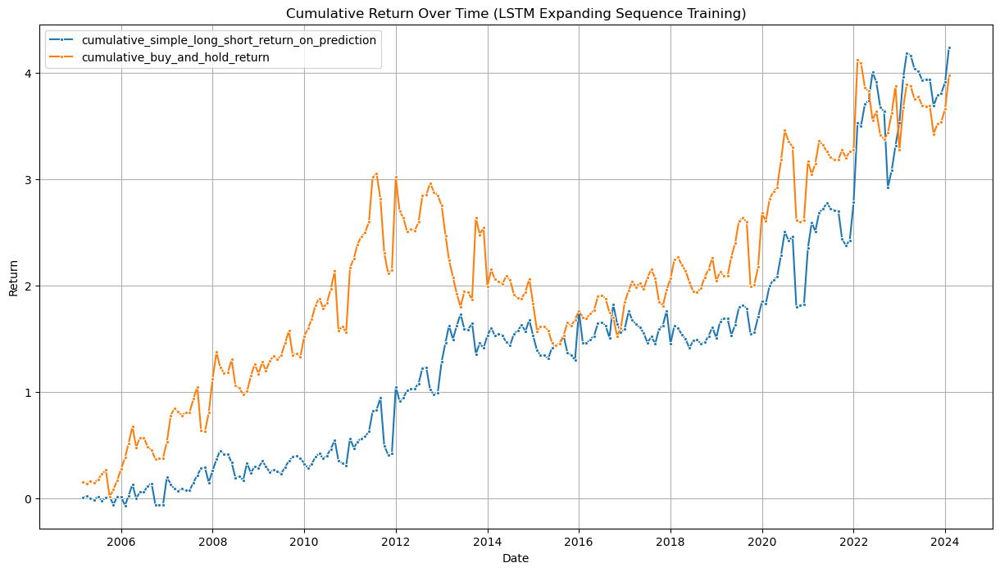

In [64]:
plt.figure(figsize=(15, 8))
sns.lineplot(data=LSTM_expanding_seq_performance_df, x='date', y='cumulative_simple_long_short_return_on_prediction',label='cumulative_simple_long_short_return_on_prediction', marker='.')
sns.lineplot(data=LSTM_expanding_seq_performance_df, x='date', y='cumulative_buy_and_hold_return', label='cumulative_buy_and_hold_return', marker='.')
plt.title('Cumulative Return Over Time (LSTM Expanding Sequence Training)')
plt.xlabel('Date')
plt.ylabel('Return')
plt.legend()
plt.grid()
plt.show()

### LSTM Variable Importance

#### LSTM fixed sequence length variable importance analysis

In [64]:
def rebuild_model_from_state_dict(config_dict, state_dict):
    device = "cuda" if torch.cuda.is_available() else "cpu"

    seed = config_dict["seed"]
    input_size = config_dict["input_size"]
    output_size = config_dict["output_size"]
    num_layers = config_dict["num_layers"]
    hidden_size = config_dict["hidden_size"]
    LSTM_dropout = config_dict["LSTM_layer_dropout_rate"]
    LSTM_bias = config_dict["LSTM_bias"]
    criterion_name = config_dict["criterion"]
    optimizer_name = config_dict["optimizer"]
    fc_layer = config_dict["fc_layer"]
    fc_activation = config_dict["fc_activation"]
    learning_rate = config_dict["learning_rate"]
    weight_decay = config_dict["weight_decay"]
    batch_size = config_dict["batch_size"]
    num_epochs = config_dict["num_epochs"]
    patience = config_dict["patience"]
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

    model = LSTM(
        input_size=input_size,
        output_size=output_size,
        num_layers=num_layers,
        batch_size=batch_size,
        fc_layer=fc_layer,
        fc_activation=fc_activation,
        bias=LSTM_bias,
        dropout=LSTM_dropout,
        hidden_size=hidden_size,
    ).to(device)
    model.load_state_dict(state_dict)
    model.to(device)  # load trained model_state_dict
    return model


def variable_importance(model, i_th_month, data_df, MSE) -> dict:
    """
    calculate variable importance
    """
    device = "cuda" if torch.cuda.is_available() else "cpu"

    _, _, _, _, X_test, y_test, meta_data_dict = generate_monthly_expanding_dataset(
        data_df=data_df,
        i_th_month=i_th_month,
        train_month_span=12,
        val_month_span=1,
        test_month_span=1,
        target_column="r_gold_forward_1",
        columns_to_drop=["r_gold_forward_1", "date"],
        verbose=False,
        reshape_y=True,
        scaling=True,
    )
    column_list_cleaned = [
        col for col in data_df.columns if col not in ["r_gold_forward_1", "date"]
    ]
    variable_importance_dict = {}

    for variable in column_list_cleaned:

        X_test_df = pd.DataFrame(X_test, columns=column_list_cleaned)
        X_test_df[variable] = 0.0

        X_tensor = torch.tensor(X_test_df.values, dtype=torch.float32).to(device)
        X_tensor = X_tensor.view(1, 1, X_tensor.shape[1])
        y_tensor = torch.tensor(y_test, dtype=torch.float32).to(device)

        model.eval()
        with torch.no_grad():
            y_test_pred = model(X_tensor)
            loss = nn.MSELoss()
            test_MSE = loss(y_test_pred, y_tensor)
        # increase in MSE
        variable_importance_dict[variable] = (test_MSE - MSE).item()

    return variable_importance_dict

In [65]:
def variable_importance_all_month(LSTM_fixed_seq_performance_and_model_dict, start_date, end_date):
    variable_importance_all_month_dict = {}
    all_month_list = list(LSTM_fixed_seq_performance_and_model_dict.keys())
    for month in all_month_list:
        if month >= start_date and month <= end_date:
            best_config_test_loss = LSTM_fixed_seq_performance_and_model_dict[str(month)]['best_config_test_loss']
            best_config = LSTM_fixed_seq_performance_and_model_dict[str(month)]['best_config']
            best_config_state_dict = LSTM_fixed_seq_performance_and_model_dict[str(month)]['best_config_state_dict']
            model = rebuild_model_from_state_dict(best_config, best_config_state_dict)
            i_th_month = LSTM_fixed_seq_performance_and_model_dict[str(month)]['i_th_month']
            variable_importance_all_month_dict[month] = variable_importance(model, i_th_month, r_data_df, best_config_test_loss)
    return variable_importance_all_month_dict

In [66]:
def overall_variable_importance(variable_importance_all_month_dict):
    cumulative_increase_in_MSE = {}
    count_increase_in_MSE = {}
    for month, variables in variable_importance_all_month_dict.items():
        for variable, increase_in_MSE in variables.items():
            if variable not in cumulative_increase_in_MSE:
                cumulative_increase_in_MSE[variable] = 0
                count_increase_in_MSE[variable] = 0
            cumulative_increase_in_MSE[variable] += increase_in_MSE
            count_increase_in_MSE[variable] += 1

    chara_variable_overall_importance_dict = {variable: cumulative_increase_in_MSE[variable] / count_increase_in_MSE[variable] for variable in cumulative_increase_in_MSE}
    return chara_variable_overall_importance_dict

2005-2015

In [67]:
# first half
start_time = '2005-03'
end_time = '2015-02'
variable_importance_first_half_dict = variable_importance_all_month(LSTM_fixed_seq_performance_and_model_dict, start_time, end_time)
variable_importance_first_half_average_dict = overall_variable_importance(variable_importance_first_half_dict)
variable_importance_first_half_average_df= pd.DataFrame(list(variable_importance_first_half_average_dict.items()), columns=['Variable', 'Increase_in_MSE'])
variable_importance_first_half_average_df.sort_values(by='Increase_in_MSE', ascending=False, inplace=True)

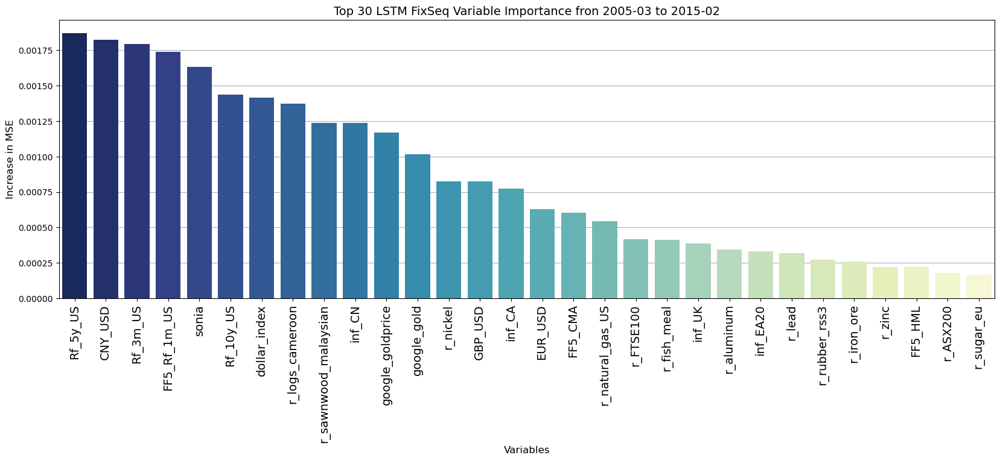

In [68]:
plt.figure(figsize=(20, 6))
sns.barplot(x=variable_importance_first_half_average_df['Variable'][0:30], y=variable_importance_first_half_average_df['Increase_in_MSE'][0:30], palette='YlGnBu_r')

plt.xlabel('Variables', fontsize=12)
plt.ylabel('Increase in MSE', fontsize=12)
plt.title(f'Top 30 LSTM FixSeq Variable Importance fron {start_time} to {end_time}', fontsize=14)
plt.xticks(rotation=90, fontsize=14)
plt.grid(axis='y', linestyle='-', zorder=0)
plt.gca().set_axisbelow(True)

plt.show()

2015-2024

In [69]:
# second half
start_time = '2015-03'
end_time = '2024-04'
variable_importance_second_half_dict = variable_importance_all_month(LSTM_fixed_seq_performance_and_model_dict, start_time, end_time)
variable_importance_second_half_average_dict = overall_variable_importance(variable_importance_second_half_dict)
variable_importance_second_half_average_df= pd.DataFrame(list(variable_importance_second_half_average_dict.items()), columns=['Variable', 'Increase_in_MSE'])
variable_importance_second_half_average_df.sort_values(by='Increase_in_MSE', ascending=False, inplace=True)

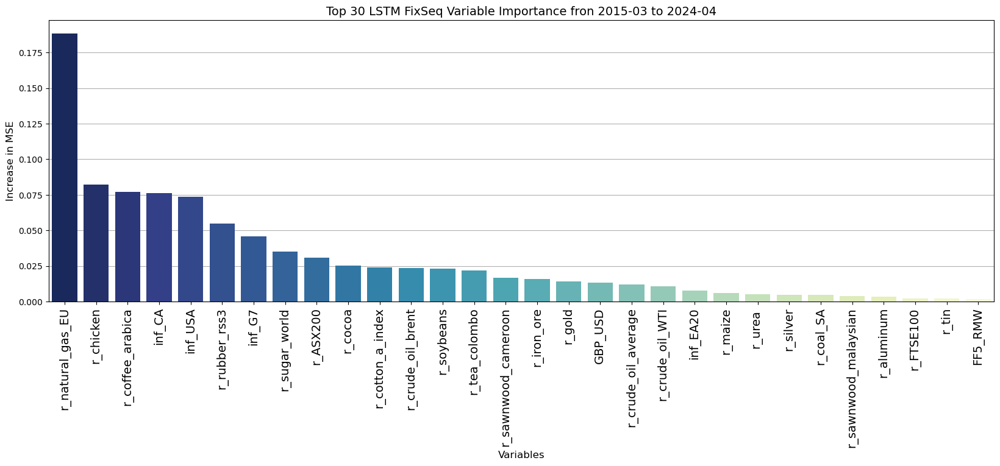

In [70]:
plt.figure(figsize=(20, 6))
sns.barplot(x=variable_importance_second_half_average_df['Variable'][0:30], y=variable_importance_second_half_average_df['Increase_in_MSE'][0:30], palette='YlGnBu_r')

plt.xlabel('Variables', fontsize=12)
plt.ylabel('Increase in MSE', fontsize=12)
plt.title(f'Top 30 LSTM FixSeq Variable Importance fron {start_time} to {end_time}', fontsize=14)
plt.xticks(rotation=90, fontsize=14)
plt.grid(axis='y', linestyle='-', zorder=0)
plt.gca().set_axisbelow(True)

plt.show()

2005-2024

In [71]:
start_time = '2005-03'
end_time = '2024-04'
variable_importance_all_time_dict = variable_importance_all_month(LSTM_fixed_seq_performance_and_model_dict, start_time, end_time)
variable_importance_all_time_average_dict = overall_variable_importance(variable_importance_all_time_dict)
variable_importance_all_time_average_df= pd.DataFrame(list(variable_importance_all_time_average_dict.items()), columns=['Variable', 'Increase_in_MSE'])
variable_importance_all_time_average_df.sort_values(by='Increase_in_MSE', ascending=False, inplace=True)

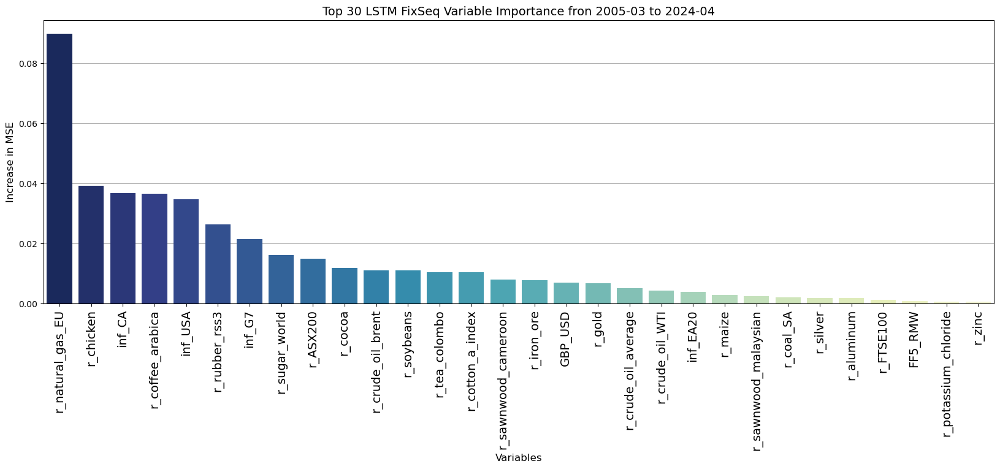

In [72]:
plt.figure(figsize=(20, 6))
sns.barplot(x=variable_importance_all_time_average_df['Variable'][0:30], y=variable_importance_all_time_average_df['Increase_in_MSE'][0:30], palette='YlGnBu_r')

plt.xlabel('Variables', fontsize=12)
plt.ylabel('Increase in MSE', fontsize=12)
plt.title(f'Top 30 LSTM FixSeq Variable Importance fron {start_time} to {end_time}', fontsize=14)
plt.xticks(rotation=90, fontsize=14)
plt.grid(axis='y', linestyle='-', zorder=0)
plt.gca().set_axisbelow(True)

plt.show()

## Linear Model

### Ordinary Least Squares

In [65]:
def recursive_ols_trainer(data_df, month_range=228, columns_to_drop=["r_gold_forward_1", "date"], target_column="r_gold_forward_1", verbose=False):
    performance_and_model_dict = {}
    
    for i_th_month in tqdm(range(month_range)):
        X_train, y_train, X_val, y_val, X_test, y_test, meta_data_dict = generate_monthly_expanding_dataset(
            data_df, i_th_month=i_th_month, train_month_span=12, val_month_span=1, test_month_span=1,
            target_column=target_column, columns_to_drop=columns_to_drop, verbose=verbose, scaling=True, reshape_y=False
        )

        model = LinearRegression()
        model.fit(X_train, y_train)
        y_val_pred = model.predict(X_val)
        val_loss = mean_squared_error(y_val, y_val_pred)
        
        y_test_pred = model.predict(X_test)
        test_loss = mean_squared_error(y_test, y_test_pred)

        oos_year_month = format_year_month(meta_data_dict['test_start_time'])
        
        performance_and_model_dict[oos_year_month] = {
            "val_loss": val_loss,
            "test_loss": test_loss,
            "predicted_y_test": y_test_pred,  
            "actual_y_test": y_test
        }

        if verbose:
            print(f'{oos_year_month} training completed with validation loss: {val_loss}')
    
    return performance_and_model_dict


In [66]:
OLS_performance_and_model_dict = recursive_ols_trainer(r_data_df)

100%|██████████| 228/228 [00:02<00:00, 91.68it/s]


In [67]:
def create_OLS_performance_df(OLS_performance_and_model_dict) -> pd.DataFrame:
    # collect data from dictionary
    OLS_eval_loss_dict = {key: value["val_loss"] for key, value in OLS_performance_and_model_dict.items()}
    OLS_pred_dict = {key: value["predicted_y_test"].item() for key, value in OLS_performance_and_model_dict.items()}
    OLS_actual_y_dict = {key: value["actual_y_test"].item() for key, value in OLS_performance_and_model_dict.items()}
    OLS_test_loss_dict = {key: value["test_loss"] for key, value in OLS_performance_and_model_dict.items()}
    # format
    OLS_pred_df = pd.DataFrame(list(OLS_pred_dict.items()), columns=['date', 'OLS_pred']).sort_values(by='date', ascending=True)
    OLS_actual_y_df = pd.DataFrame(list(OLS_actual_y_dict.items()), columns=['date', 'actual_y']).sort_values(by='date', ascending=True)
    OLS_eval_MSE_df = pd.DataFrame(list(OLS_eval_loss_dict.items()), columns=['date', 'OLS_eval_MSE']).sort_values(by='date', ascending=True)
    OLS_test_MSE_df = pd.DataFrame(list(OLS_test_loss_dict.items()), columns=['date', 'OLS_test_MSE']).sort_values(by='date', ascending=True)
    # set index for merging
    OLS_pred_df.set_index('date', inplace=True)
    OLS_actual_y_df.set_index('date', inplace=True)
    OLS_eval_MSE_df.set_index('date', inplace=True)
    OLS_test_MSE_df.set_index('date', inplace=True)
    # concatenate dataframes
    OLS_performance_df =  pd.concat([
        OLS_pred_df,
        OLS_actual_y_df,
        OLS_eval_MSE_df,
        OLS_test_MSE_df],
        axis=1,).sort_index()
    OLS_performance_df.index = pd.to_datetime(OLS_performance_df.index)
    return OLS_performance_df

def performance_evaluation_OLS(dataframe) -> pd.DataFrame:
    # Compute the signs of the predictions and actual values
    dataframe['pred_sign'] = dataframe['OLS_pred'].apply(lambda x: 'Positive' if x > 0 else 'Negative')
    dataframe['actual_sign'] = dataframe['actual_y'].apply(lambda x: 'Positive' if x > 0 else 'Negative')
    # Determine if the prediction sign matches the actual sign
    dataframe['correct_sign_bool'] = dataframe['pred_sign'] == dataframe['actual_sign']
    # Convert the boolean correctness to numeric form (1 for correct, -1 for incorrect)
    dataframe['correct_sign_numeric'] = dataframe['correct_sign_bool'].apply(lambda x: 1 if x else -1)
    # Calculate a the simple long-short return based on sign prediction 
    # gain if correct sign, lost if incorrect sign
    dataframe['simple_long_short_return_on_prediction'] = dataframe['correct_sign_numeric'] * abs(dataframe['actual_y'])
    # create new column called buy and hold return
    dataframe['buy_and_hold_return'] = dataframe['actual_y']
    dataframe
    # Accumulate the returns over time
    dataframe['cumulative_simple_long_short_return_on_prediction'] = (1 + dataframe['simple_long_short_return_on_prediction']).cumprod() - 1
    dataframe['cumulative_buy_and_hold_return'] = (1 + dataframe['buy_and_hold_return']).cumprod() - 1
    # Display results
    simple_long_short_return_on_prediction = dataframe['simple_long_short_return_on_prediction'].sum()
    buy_and_hold_return = dataframe['buy_and_hold_return'].sum()
    sign_prediction_accuracy = dataframe['correct_sign_bool'].mean()
    prediction_mse = mean_squared_error(dataframe['actual_y'], dataframe['OLS_pred'])
    print("Simple Long-Short Strategy Total Return: {:.2f}%".format(simple_long_short_return_on_prediction * 100))
    print("Buy and Hold Total Return: {:.2f}%".format(buy_and_hold_return * 100))
    print("Sign Prediction Accuracy: {:.2f}%".format(sign_prediction_accuracy * 100))

    return dataframe, simple_long_short_return_on_prediction, buy_and_hold_return, sign_prediction_accuracy, prediction_mse

In [68]:
OLS_performance_df = create_OLS_performance_df(OLS_performance_and_model_dict)
OLS_performance_df, OLS_simple_long_short_return_on_prediction, buy_and_hold_return, OLS_sign_prediction_accuracy, OLS_prediction_mse = performance_evaluation_OLS(OLS_performance_df)

Simple Long-Short Strategy Total Return: 121.27%
Buy and Hold Total Return: 177.22%
Sign Prediction Accuracy: 54.82%


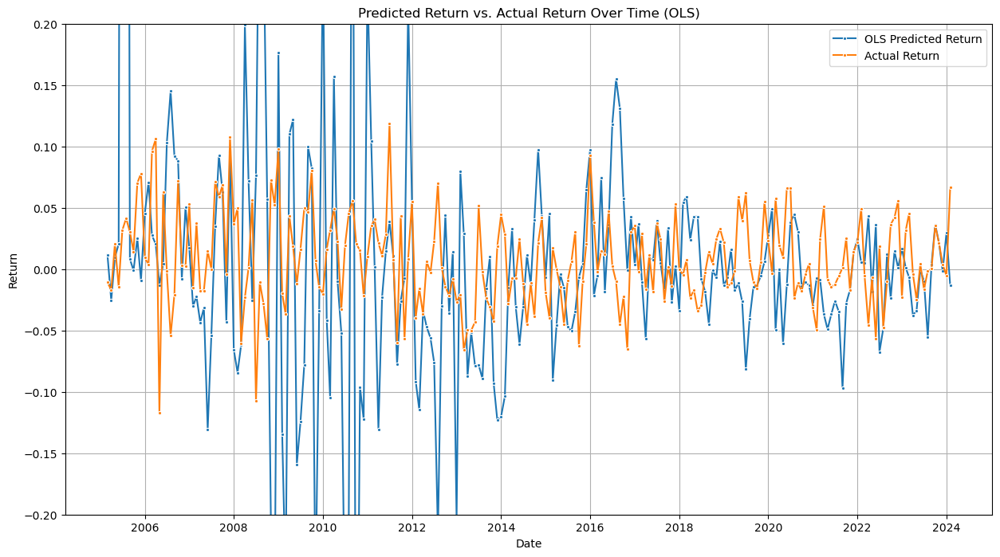

In [69]:
plt.figure(figsize=(15, 8))
sns.lineplot(data=OLS_performance_df, x='date', y='OLS_pred',label='OLS Predicted Return', marker='.')
sns.lineplot(data=OLS_performance_df, x='date', y='actual_y', label='Actual Return', marker='.')
plt.title('Predicted Return vs. Actual Return Over Time (OLS)')
plt.xlabel('Date')
plt.ylabel('Return')
plt.ylim(-0.2, 0.2)
plt.legend()
plt.grid()
plt.show()

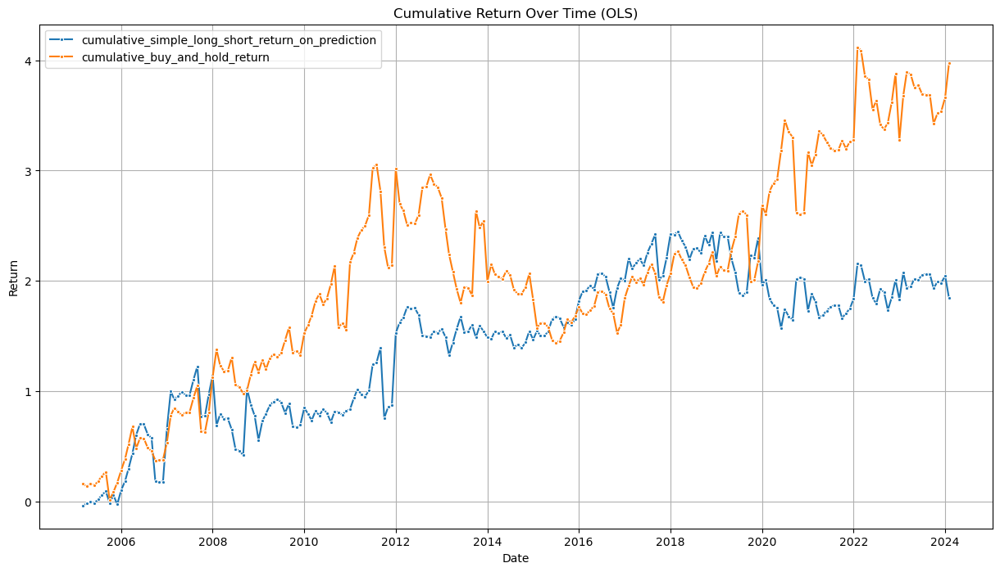

In [70]:
plt.figure(figsize=(15, 8))
sns.lineplot(data=OLS_performance_df, x='date', y='cumulative_simple_long_short_return_on_prediction',label='cumulative_simple_long_short_return_on_prediction', marker='.')
sns.lineplot(data=OLS_performance_df, x='date', y='cumulative_buy_and_hold_return', label='cumulative_buy_and_hold_return', marker='.')
plt.title('Cumulative Return Over Time (OLS)')
plt.xlabel('Date')
plt.ylabel('Return')
plt.legend()
plt.grid()
plt.show()

### LASSO Regression

In [71]:
def recursive_lasso_trainer(data_df, lambda_values, month_range=228, columns_to_drop=["r_gold_forward_1", "date"], target_column="r_gold_forward_1", verbose=False):
    performance_and_model_dict = {}
    
    for i_th_month in tqdm(range(month_range)):
        X_train, y_train, X_val, y_val, X_test, y_test, meta_data_dict = generate_monthly_expanding_dataset(
            data_df, i_th_month=i_th_month, train_month_span=12, val_month_span=1, test_month_span=1,
            target_column=target_column, columns_to_drop=columns_to_drop, verbose=verbose, scaling=True, reshape_y=False
        )

        best_lambda = None
        best_val_loss = float('inf')
        best_model = None

        for lambda_val in lambda_values:
            model = Lasso(alpha=lambda_val, max_iter=20000, random_state=9)
            model.fit(X_train, y_train)
            y_val_pred = model.predict(X_val)
            val_loss = mean_squared_error(y_val, y_val_pred)

            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_lambda = lambda_val
                best_model = model

        y_test_pred = best_model.predict(X_test)
        test_loss = mean_squared_error(y_test, y_test_pred)

        oos_year_month = format_year_month(meta_data_dict['test_start_time'])

        performance_and_model_dict[oos_year_month] = {
            "best_model": best_model,
            "lasso_coef": best_model.coef_,
            "best_lambda": best_lambda,
            "best_val_loss": best_val_loss,
            "test_loss": test_loss,
            "predicted_y_test": y_test_pred,  
            "actual_y_test": y_test,
        }

        if verbose:
            print(f'{oos_year_month} training completed with best lambda: {best_lambda}')
    
    return performance_and_model_dict

In [72]:
lambda_values =[0.01, 0.001, 0.0001]
LASSO_performance_and_model_dict = recursive_lasso_trainer(r_data_df, lambda_values)

100%|██████████| 228/228 [00:11<00:00, 20.39it/s]


In [73]:
def create_LASSO_performance_df(LASSO_performance_and_model_dict) -> pd.DataFrame:
    # collect data from dictionary
    LASSO_eval_loss_dict = {key: value["best_val_loss"] for key, value in LASSO_performance_and_model_dict.items()}
    LASSO_pred_dict = {key: value["predicted_y_test"].item() for key, value in LASSO_performance_and_model_dict.items()}
    LASSO_actual_y_dict = {key: value["actual_y_test"].item() for key, value in LASSO_performance_and_model_dict.items()}
    LASSO_test_loss_dict = {key: value["test_loss"] for key, value in LASSO_performance_and_model_dict.items()}
    # format
    LASSO_pred_df = pd.DataFrame(list(LASSO_pred_dict.items()), columns=['date', 'LASSO_pred']).sort_values(by='date', ascending=True)
    LASSO_actual_y_df = pd.DataFrame(list(LASSO_actual_y_dict.items()), columns=['date', 'actual_y']).sort_values(by='date', ascending=True)
    LASSO_eval_MSE_df = pd.DataFrame(list(LASSO_eval_loss_dict.items()), columns=['date', 'LASSO_eval_MSE']).sort_values(by='date', ascending=True)
    LASSO_test_MSE_df = pd.DataFrame(list(LASSO_test_loss_dict.items()), columns=['date', 'LASSO_test_MSE']).sort_values(by='date', ascending=True)
    # set index for merging
    LASSO_pred_df.set_index('date', inplace=True)
    LASSO_actual_y_df.set_index('date', inplace=True)
    LASSO_eval_MSE_df.set_index('date', inplace=True)
    LASSO_test_MSE_df.set_index('date', inplace=True)
    # concatenate dataframes
    LASSO_performance_df =  pd.concat([
        LASSO_pred_df,
        LASSO_actual_y_df,
        LASSO_eval_MSE_df,
        LASSO_test_MSE_df],
        axis=1,).sort_index()
    LASSO_performance_df.index = pd.to_datetime(LASSO_performance_df.index)
    return LASSO_performance_df

def performance_evaluation_LASSO(dataframe) -> pd.DataFrame:
    # Compute the signs of the predictions and actual values
    dataframe['pred_sign'] = dataframe['LASSO_pred'].apply(lambda x: 'Positive' if x > 0 else 'Negative')
    dataframe['actual_sign'] = dataframe['actual_y'].apply(lambda x: 'Positive' if x > 0 else 'Negative')
    # Determine if the prediction sign matches the actual sign
    dataframe['correct_sign_bool'] = dataframe['pred_sign'] == dataframe['actual_sign']
    # Convert the boolean correctness to numeric form (1 for correct, -1 for incorrect)
    dataframe['correct_sign_numeric'] = dataframe['correct_sign_bool'].apply(lambda x: 1 if x else -1)
    # Calculate a the simple long-short return based on sign prediction 
    # gain if correct sign, lost if incorrect sign
    dataframe['simple_long_short_return_on_prediction'] = dataframe['correct_sign_numeric'] * abs(dataframe['actual_y'])
    # create new column called buy and hold return
    dataframe['buy_and_hold_return'] = dataframe['actual_y']
    dataframe
    # Accumulate the returns over time
    dataframe['cumulative_simple_long_short_return_on_prediction'] = (1 + dataframe['simple_long_short_return_on_prediction']).cumprod() - 1
    dataframe['cumulative_buy_and_hold_return'] = (1 + dataframe['buy_and_hold_return']).cumprod() - 1
    # Display results
    simple_long_short_return_on_prediction = dataframe['simple_long_short_return_on_prediction'].sum()
    buy_and_hold_return = dataframe['buy_and_hold_return'].sum()
    sign_prediction_accuracy = dataframe['correct_sign_bool'].mean()
    prediction_mse = mean_squared_error(dataframe['actual_y'], dataframe['LASSO_pred'])
    print("Simple Long-Short Strategy Total Return: {:.2f}%".format(simple_long_short_return_on_prediction * 100))
    print("Buy and Hold Total Return: {:.2f}%".format(buy_and_hold_return * 100))
    print("Sign Prediction Accuracy: {:.2f}%".format(sign_prediction_accuracy * 100))

    return dataframe, simple_long_short_return_on_prediction, buy_and_hold_return, sign_prediction_accuracy, prediction_mse

In [74]:
LASSO_performance_df = create_LASSO_performance_df(LASSO_performance_and_model_dict)
LASSO_performance_df, LASSO_simple_long_short_return_on_prediction, buy_and_hold_return, LASSO_sign_prediction_accuracy, LASSO_prediction_mse= performance_evaluation_LASSO(LASSO_performance_df)

Simple Long-Short Strategy Total Return: 188.98%
Buy and Hold Total Return: 177.22%
Sign Prediction Accuracy: 57.46%


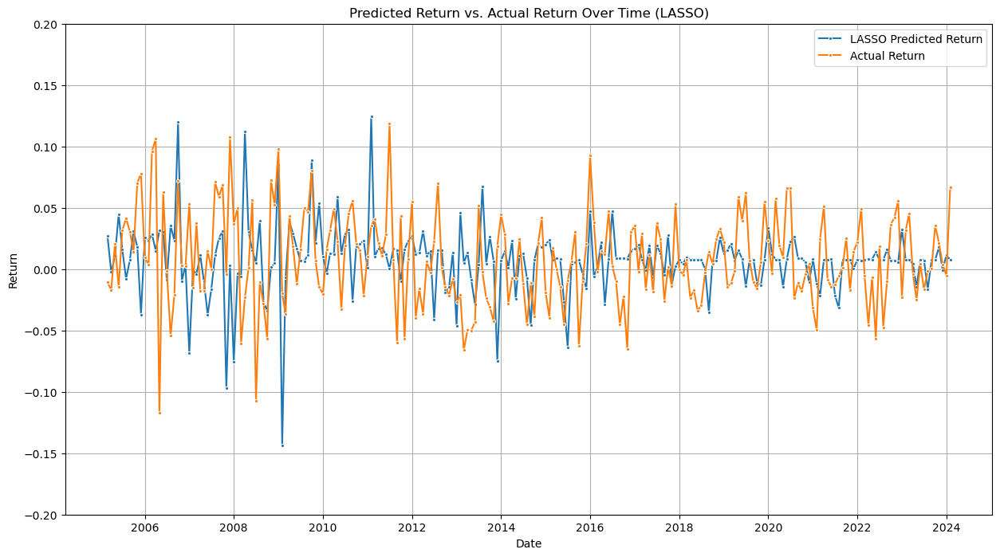

In [75]:
plt.figure(figsize=(15, 8))
sns.lineplot(data=LASSO_performance_df, x='date', y='LASSO_pred',label='LASSO Predicted Return', marker='.')
sns.lineplot(data=LASSO_performance_df, x='date', y='actual_y', label='Actual Return', marker='.')
plt.title('Predicted Return vs. Actual Return Over Time (LASSO)')
plt.xlabel('Date')
plt.ylabel('Return')
plt.ylim(-0.2, 0.2)
plt.legend()
plt.grid()
plt.show()

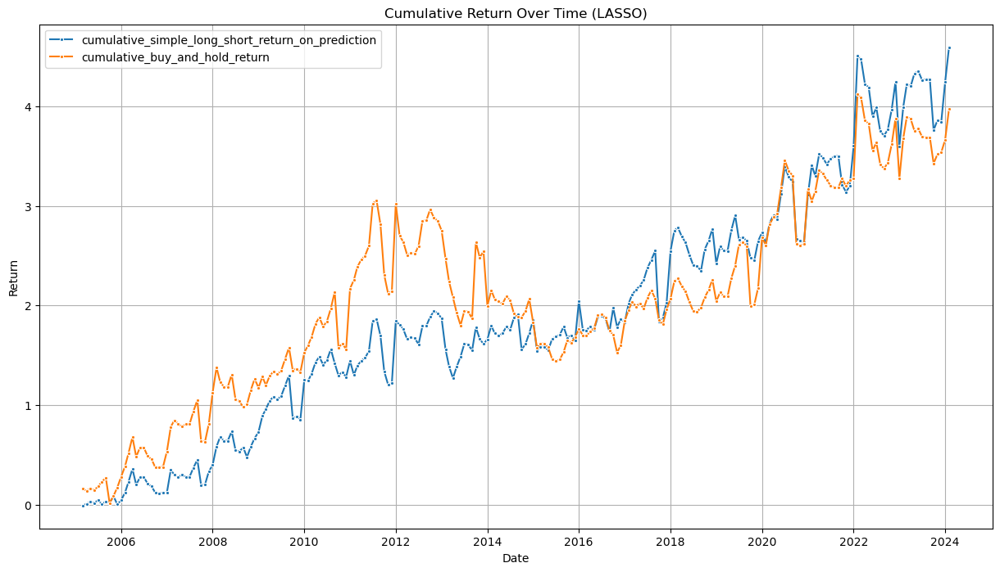

In [76]:
plt.figure(figsize=(15, 8))
sns.lineplot(data=LASSO_performance_df, x='date', y='cumulative_simple_long_short_return_on_prediction',label='cumulative_simple_long_short_return_on_prediction', marker='.')
sns.lineplot(data=LASSO_performance_df, x='date', y='cumulative_buy_and_hold_return', label='cumulative_buy_and_hold_return', marker='.')
plt.title('Cumulative Return Over Time (LASSO)')
plt.xlabel('Date')
plt.ylabel('Return')
plt.legend()
plt.grid()
plt.show()

#### LASSO Coefficient Analysis

In [91]:
# collect all lasso coefficients and get their mean 
all_lasso_coefs = []
for year, data_dict in LASSO_performance_and_model_dict.items():
    all_lasso_coefs.append(data_dict['lasso_coef'])
all_lasso_coefs = np.array(all_lasso_coefs)

average_lasso_coefs = np.mean(all_lasso_coefs, axis=0)
r_data_df_data_columns_only = r_data_df.drop(columns=["r_gold_forward_1", "date"])
average_lasso_coefs_df = pd.DataFrame(average_lasso_coefs, index=r_data_df_data_columns_only.columns, columns=['Average_LASSO_Coef'])
average_lasso_coefs_df.sort_values(by='Average_LASSO_Coef', ascending=False, inplace=True)

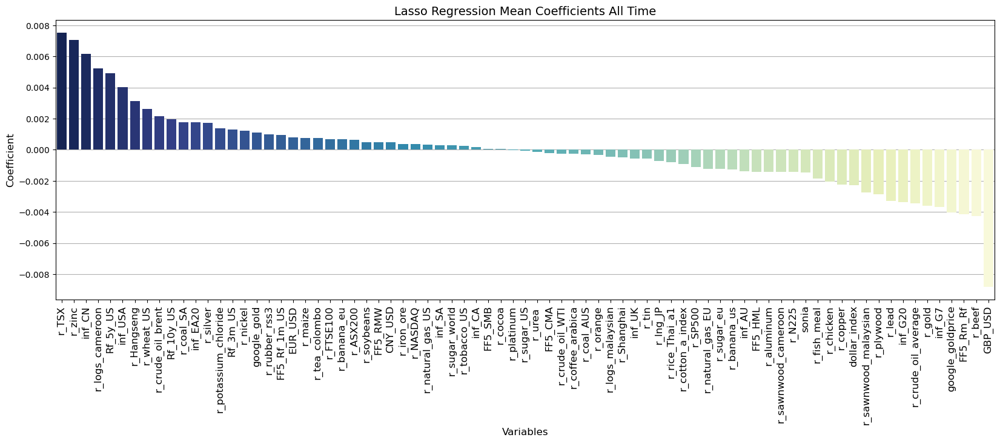

In [92]:
plt.figure(figsize=(20, 6))
sns.barplot(x=average_lasso_coefs_df.index, y=average_lasso_coefs_df['Average_LASSO_Coef'], palette='YlGnBu_r')

plt.xlabel('Variables', fontsize=12)
plt.ylabel('Coefficient', fontsize=12)
plt.title(f'Lasso Regression Mean Coefficients All Time', fontsize=14)
plt.xticks(rotation=90, fontsize=12)
plt.grid(axis='y', linestyle='-', zorder=0)
plt.gca().set_axisbelow(True)

plt.show()

## Tree based model

### XGBoost

In [93]:
xgb_config_search_space_dict = {
    'random_state': [9],
    'objective': ['reg:squarederror'],
    'colsample_bytree': [0.4, 0.6],
    'learning_rate': [0.1, 0.01],
    'max_depth': [4, 8],
    'lambda': [1 , 0.1, 0.01],
    'n_estimators': [100, 300, 500],
    'subsample': [0.8, 1.0],
    'device': ['cpu'],
    'tree_method': ['auto'],
}

# Generate list of all configurations
xgb_config_search_space_dict_list = list(ParameterGrid(xgb_config_search_space_dict))
print(f'Configuration search space size: {len(xgb_config_search_space_dict_list)}')

Configuration search space size: 144


In [94]:
def recursive_xgboost_trainer(data_df, config_dict_list, month_range=228, columns_to_drop=["r_gold", "r_gold_forward_1", "date"], target_column="r_gold_forward_1", verbose=False):
    performance_and_model_dict = {}
    
    for i_th_month in tqdm(range(month_range)):
        X_train, y_train, X_val, y_val, X_test, y_test, meta_data_dict = generate_monthly_expanding_dataset(
            data_df, i_th_month=i_th_month, train_month_span=12, val_month_span=1, test_month_span=1,
            target_column=target_column, columns_to_drop=columns_to_drop, verbose=verbose, scaling=True, reshape_y=False
        )

        best_config = None
        best_val_loss = float('inf')
        best_model = None

        for config in config_dict_list:
            model = xgb.XGBRegressor(**config)
            model.fit(X_train, y_train)
            y_val_pred = model.predict(X_val)
            val_loss = mean_squared_error(y_val, y_val_pred)

            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_config = config
                best_model = model

        y_test_pred = best_model.predict(X_test)
        test_loss = mean_squared_error(y_test, y_test_pred)

        oos_year_month = format_year_month(meta_data_dict['test_start_time'])

        performance_and_model_dict[oos_year_month] = {
            "best_model": best_model,
            "best_config": best_config,
            "best_val_loss": best_val_loss,
            "test_loss": test_loss,
            "predicted_y_test": y_test_pred,  
            "actual_y_test": y_test,
        }

        if verbose:
            print(f'{oos_year_month} training completed with best config: {best_config}')
    
    return performance_and_model_dict

In [ ]:
xgb_performance_and_model_dict = recursive_xgboost_trainer(r_data_df, xgb_config_search_space_dict_list)
# model check point
# with open("xgb_performance_and_model_dict.pkl", "wb") as f:
#     pickle.dump(xgb_performance_and_model_dict, f)

100%|██████████| 228/228 [1:38:16<00:00, 25.86s/it]


In [77]:
# load check point if previously saved
# xgb_performance_and_model_dict = pickle.load(open("xgb_performance_and_model_dict.pkl", "rb"))

In [78]:
def create_xgb_performance_df(xgb_performance_and_model_dict) -> pd.DataFrame:
    # collect data from dictionary
    xgb_eval_loss_dict = {key: value["best_val_loss"] for key, value in xgb_performance_and_model_dict.items()}
    xgb_pred_dict = {key: value["predicted_y_test"].item() for key, value in xgb_performance_and_model_dict.items()}
    xgb_actual_y_dict = {key: value["actual_y_test"].item() for key, value in xgb_performance_and_model_dict.items()}
    xgb_test_loss_dict = {key: value["test_loss"] for key, value in xgb_performance_and_model_dict.items()}
    # format
    xgb_pred_df = pd.DataFrame(list(xgb_pred_dict.items()), columns=['date', 'xgb_pred']).sort_values(by='date', ascending=True)
    xgb_actual_y_df = pd.DataFrame(list(xgb_actual_y_dict.items()), columns=['date', 'actual_y']).sort_values(by='date', ascending=True)
    xgb_eval_MSE_df = pd.DataFrame(list(xgb_eval_loss_dict.items()), columns=['date', 'xgb_eval_MSE']).sort_values(by='date', ascending=True)
    xgb_test_MSE_df = pd.DataFrame(list(xgb_test_loss_dict.items()), columns=['date', 'xgb_test_MSE']).sort_values(by='date', ascending=True)
    # set index for merging
    xgb_pred_df.set_index('date', inplace=True)
    xgb_actual_y_df.set_index('date', inplace=True)
    xgb_eval_MSE_df.set_index('date', inplace=True)
    xgb_test_MSE_df.set_index('date', inplace=True)
    # concatenate dataframes
    xgb_performance_df =  pd.concat([
        xgb_pred_df,
        xgb_actual_y_df,
        xgb_eval_MSE_df,
        xgb_test_MSE_df],
        axis=1,).sort_index()
    xgb_performance_df.index = pd.to_datetime(xgb_performance_df.index)
    return xgb_performance_df

def performance_evaluation_xgb(dataframe) -> pd.DataFrame:
    # Compute the signs of the predictions and actual values
    dataframe['pred_sign'] = dataframe['xgb_pred'].apply(lambda x: 'Positive' if x > 0 else 'Negative')
    dataframe['actual_sign'] = dataframe['actual_y'].apply(lambda x: 'Positive' if x > 0 else 'Negative')
    # Determine if the prediction sign matches the actual sign
    dataframe['correct_sign_bool'] = dataframe['pred_sign'] == dataframe['actual_sign']
    # Convert the boolean correctness to numeric form (1 for correct, -1 for incorrect)
    dataframe['correct_sign_numeric'] = dataframe['correct_sign_bool'].apply(lambda x: 1 if x else -1)
    # Calculate a the simple long-short return based on sign prediction 
    # gain if correct sign, lost if incorrect sign
    dataframe['simple_long_short_return_on_prediction'] = dataframe['correct_sign_numeric'] * abs(dataframe['actual_y'])
    # create new column called buy and hold return
    dataframe['buy_and_hold_return'] = dataframe['actual_y']
    dataframe
    # Accumulate the returns over time
    dataframe['cumulative_simple_long_short_return_on_prediction'] = (1 + dataframe['simple_long_short_return_on_prediction']).cumprod() - 1
    dataframe['cumulative_buy_and_hold_return'] = (1 + dataframe['buy_and_hold_return']).cumprod() - 1
    # Display results
    simple_long_short_return_on_prediction = dataframe['simple_long_short_return_on_prediction'].sum()
    buy_and_hold_return = dataframe['buy_and_hold_return'].sum()
    sign_prediction_accuracy = dataframe['correct_sign_bool'].mean()
    prediction_mse = mean_squared_error(dataframe['actual_y'], dataframe['xgb_pred'])
    print("Simple Long-Short Strategy Total Return: {:.2f}%".format(simple_long_short_return_on_prediction * 100))
    print("Buy and Hold Total Return: {:.2f}%".format(buy_and_hold_return * 100))
    print("Sign Prediction Accuracy: {:.2f}%".format(sign_prediction_accuracy * 100))

    return dataframe, simple_long_short_return_on_prediction, buy_and_hold_return, sign_prediction_accuracy, prediction_mse

In [79]:
xgb_performance_df = create_xgb_performance_df(xgb_performance_and_model_dict)
xgb_performance_df, xgb_simple_long_short_return_on_prediction, buy_and_hold_return, xgb_sign_prediction_accuracy, xgb_prediction_mse = performance_evaluation_xgb(xgb_performance_df)

Simple Long-Short Strategy Total Return: 190.89%
Buy and Hold Total Return: 177.22%
Sign Prediction Accuracy: 59.21%


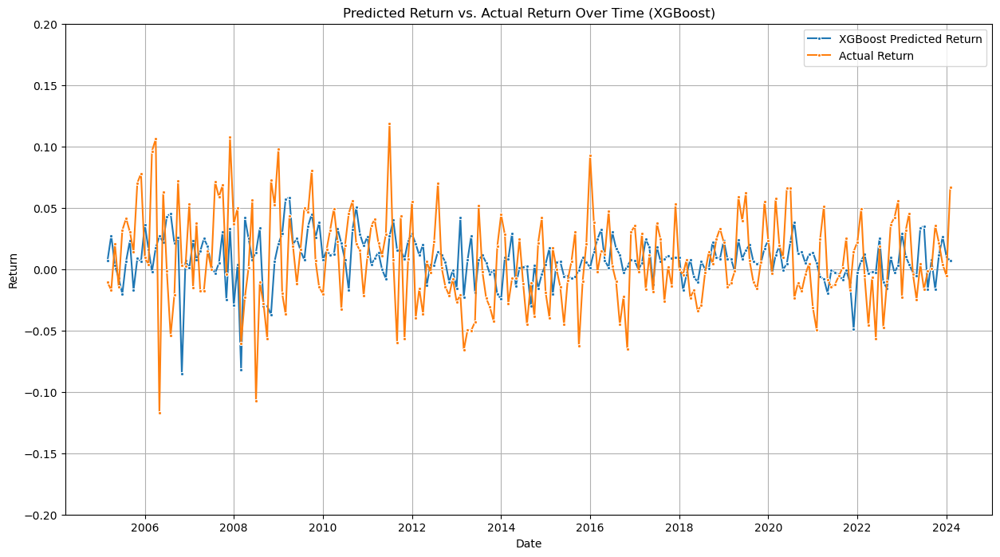

In [80]:
plt.figure(figsize=(15, 8))
sns.lineplot(data=xgb_performance_df, x='date', y='xgb_pred',label='XGBoost Predicted Return', marker='.')
sns.lineplot(data=xgb_performance_df, x='date', y='actual_y', label='Actual Return', marker='.')
plt.title('Predicted Return vs. Actual Return Over Time (XGBoost)')
plt.xlabel('Date')
plt.ylabel('Return')
plt.ylim(-0.2, 0.2)
plt.legend()
plt.grid()
plt.show()

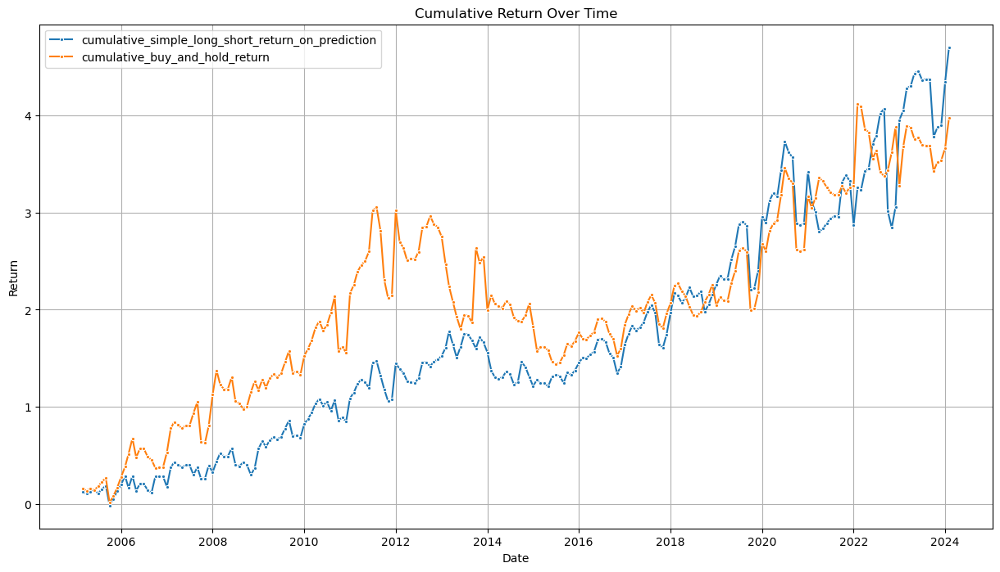

In [81]:
plt.figure(figsize=(15, 8))
sns.lineplot(data=xgb_performance_df, x='date', y='cumulative_simple_long_short_return_on_prediction',label='cumulative_simple_long_short_return_on_prediction', marker='.')
sns.lineplot(data=xgb_performance_df, x='date', y='cumulative_buy_and_hold_return', label='cumulative_buy_and_hold_return', marker='.')
plt.title('Cumulative Return Over Time')
plt.xlabel('Date')
plt.ylabel('Return')
plt.legend()
plt.grid()
plt.show()

#### XBGoost SHAP Value

For time efficiency, we sampled two xgboost models in different time period to compare SHAP Value. 

train_start_time: 2004-02-01, train_end_time: 2024-01-01
val_start_time: 2024-01-01, val_end_time: 2024-02-01
test_start_time: 2024-02-01, test_end_time: 2024-03-01


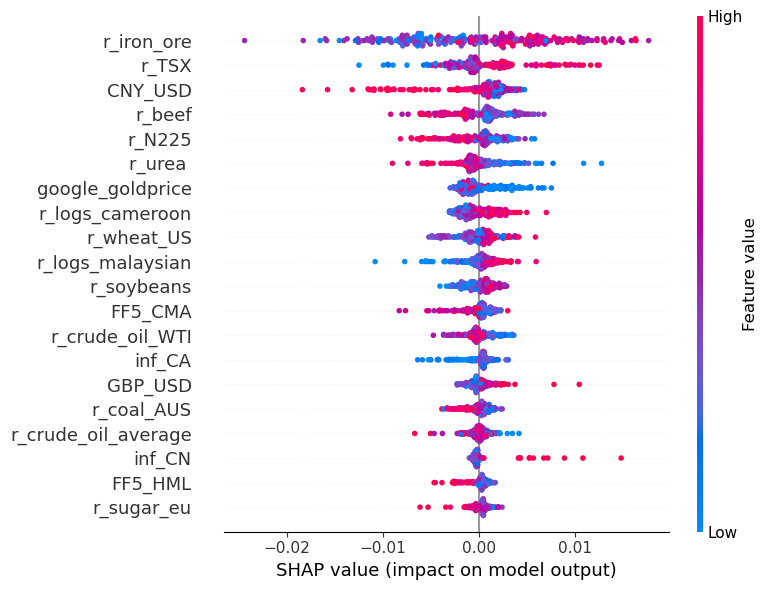

In [100]:
# sample a single xgboost: 2024-2
xgb_model_032024= xgb_performance_and_model_dict['2024-2']['best_model']
X_train, y_train, _, _, X_test, y_test, meta_data_dict = generate_monthly_expanding_dataset(
            r_data_df, i_th_month=227, train_month_span=12, val_month_span=1, test_month_span=1,
            target_column=['r_gold_forward_1'], columns_to_drop=["r_gold", "r_gold_forward_1", "date"], verbose=True, scaling=True, reshape_y=False
        )
features_list_xgbshap= r_data_df.drop(columns=["r_gold", "r_gold_forward_1", "date"]).columns.to_list()
explainer = shap.TreeExplainer(xgb_model_032024)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train, feature_names=features_list_xgbshap, plot_size=(8, 6))

train_start_time: 2004-02-01, train_end_time: 2015-01-01
val_start_time: 2015-01-01, val_end_time: 2015-02-01
test_start_time: 2015-02-01, test_end_time: 2015-03-01


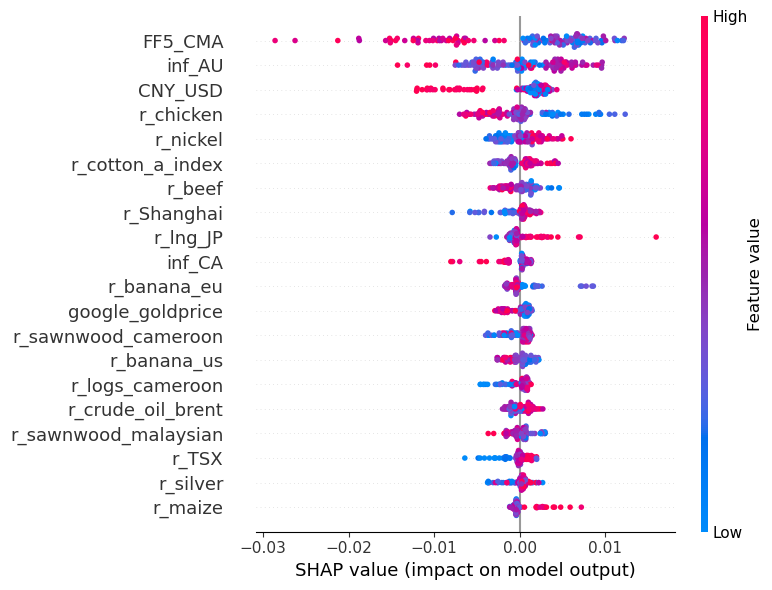

In [101]:
# sample a single xgboost: 2015-2
xgb_model_022015= xgb_performance_and_model_dict['2015-2']['best_model']
X_train, y_train, _, _, X_test, y_test, meta_data_dict = generate_monthly_expanding_dataset(
            r_data_df, i_th_month=119, train_month_span=12, val_month_span=1, test_month_span=1,
            target_column=['r_gold_forward_1'], columns_to_drop=["r_gold", "r_gold_forward_1", "date"], verbose=True, scaling=True, reshape_y=False
        )
features_list_xgbshap= r_data_df.drop(columns=["r_gold", "r_gold_forward_1", "date"]).columns.to_list()
explainer = shap.TreeExplainer(xgb_model_022015)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train, feature_names=features_list_xgbshap, plot_size=(8, 6))

# Performance Analysis

## Return analysis

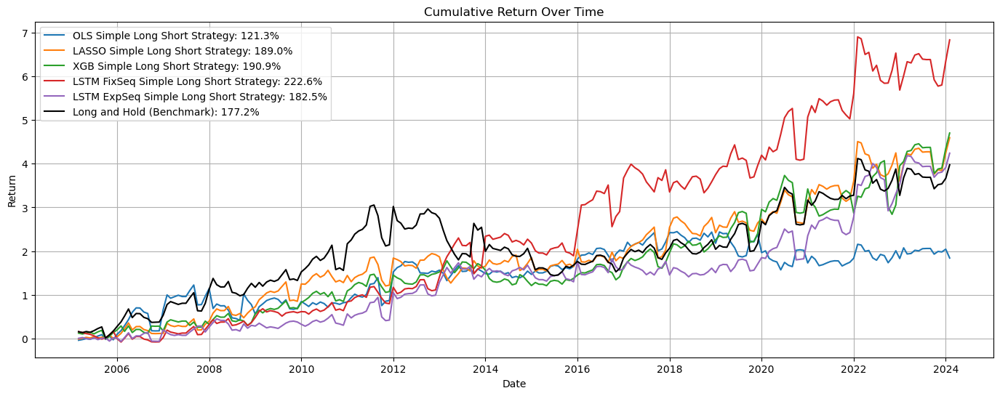

In [91]:
plt.figure(figsize=(17, 6))

sns.lineplot(data=OLS_performance_df, x='date', y='cumulative_simple_long_short_return_on_prediction',label=f'OLS Simple Long Short Strategy: {round(OLS_simple_long_short_return_on_prediction*100,1)}%')
sns.lineplot(data=LASSO_performance_df, x='date', y='cumulative_simple_long_short_return_on_prediction',label=f'LASSO Simple Long Short Strategy: {round(LASSO_simple_long_short_return_on_prediction*100,1)}%')
sns.lineplot(data=xgb_performance_df, x='date', y='cumulative_simple_long_short_return_on_prediction',label=f'XGB Simple Long Short Strategy: {round(xgb_simple_long_short_return_on_prediction*100,1)}%')
sns.lineplot(data=LSTM_fixed_seq_performance_df, x='date', y='cumulative_simple_long_short_return_on_prediction',label=f'LSTM FixSeq Simple Long Short Strategy: {round(LSTM_fixed_seq_simple_long_short_return_on_prediction*100,1)}%')
sns.lineplot(data=LSTM_expanding_seq_performance_df, x='date', y='cumulative_simple_long_short_return_on_prediction',label=f'LSTM ExpSeq Simple Long Short Strategy: {round(LSTM_expanding_seq_simple_long_short_return_on_prediction*100,1)}%')
sns.lineplot(data=LSTM_expanding_seq_performance_df, x='date', y='cumulative_buy_and_hold_return', label=f'Long and Hold (Benchmark): {round(buy_and_hold_return*100,1)}%', color='black')

plt.title('Cumulative Return Over Time')
plt.xlabel('Date')
plt.ylabel('Return')
plt.legend()
plt.grid()
plt.show()

## Accuracy analysis

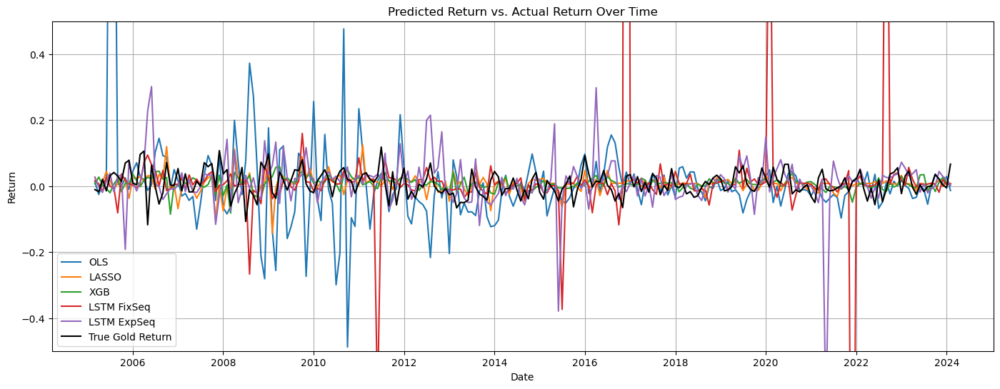

In [83]:
plt.figure(figsize=(17, 6))

sns.lineplot(data=OLS_performance_df, x='date', y='OLS_pred',label=f'OLS')
sns.lineplot(data=LASSO_performance_df, x='date', y='LASSO_pred',label=f'LASSO')
sns.lineplot(data=xgb_performance_df, x='date', y='xgb_pred',label=f'XGB')
sns.lineplot(data=LSTM_fixed_seq_performance_df, x='date', y='LSTM_fixed_seq_pred',label=f'LSTM FixSeq')
sns.lineplot(data=LSTM_expanding_seq_performance_df, x='date', y='LSTM_expanding_seq_pred',label=f'LSTM ExpSeq')
sns.lineplot(data=LSTM_expanding_seq_performance_df, x='date', y='actual_y',label=f'True Gold Return', color='black')

plt.title('Predicted Return vs. Actual Return Over Time')
plt.xlabel('Date')
plt.ylabel('Return')
plt.ylim(-0.5, 0.5)
plt.legend()
plt.grid()
plt.show()

In [84]:
overall_performance = {
    'Model': [
        'OLS',
        'LASSO',
        'XGBoost',
        'LSTM Fixed Seq',
        'LSTM Expanding Seq'
    ],
    'Simple Long Short Return': [
        OLS_simple_long_short_return_on_prediction,
        LASSO_simple_long_short_return_on_prediction,
        xgb_simple_long_short_return_on_prediction,
        LSTM_fixed_seq_simple_long_short_return_on_prediction,
        LSTM_expanding_seq_simple_long_short_return_on_prediction
    ],
    'Buy and Hold Return': [
        buy_and_hold_return,
        buy_and_hold_return,
        buy_and_hold_return,
        buy_and_hold_return,
        buy_and_hold_return
    ],
    'Sign Prediction Accuracy': [
        OLS_sign_prediction_accuracy,
        LASSO_sign_prediction_accuracy,
        xgb_sign_prediction_accuracy,
        LSTM_fixed_seq_sign_prediction_accuracy,
        LSTM_expanding_seq_sign_prediction_accuracy
    ],
    'Prediction MSE': [
        OLS_prediction_mse,
        LASSO_prediction_mse,
        xgb_prediction_mse,
        LSTM_fixed_seq_prediction_mse,
        LSTM_expanding_seq_prediction_mse
    ]
}

In [85]:
overall_performance_df = pd.DataFrame(overall_performance)
overall_performance_df=overall_performance_df.set_index('Model')

In [86]:
overall_performance_df

,Simple Long Short Return,Buy and Hold Return,Sign Prediction Accuracy,Prediction MSE
Model,,,,
OLS,1.212714,1.772179,0.548246,0.027894
LASSO,1.889813,1.772179,0.574561,0.001930
XGBoost,1.908878,1.772179,0.592105,0.001659
LSTM Fixed Seq,2.225909,1.772179,0.587719,0.195783
LSTM Expanding Seq,1.825045,1.772179,0.565789,0.007224


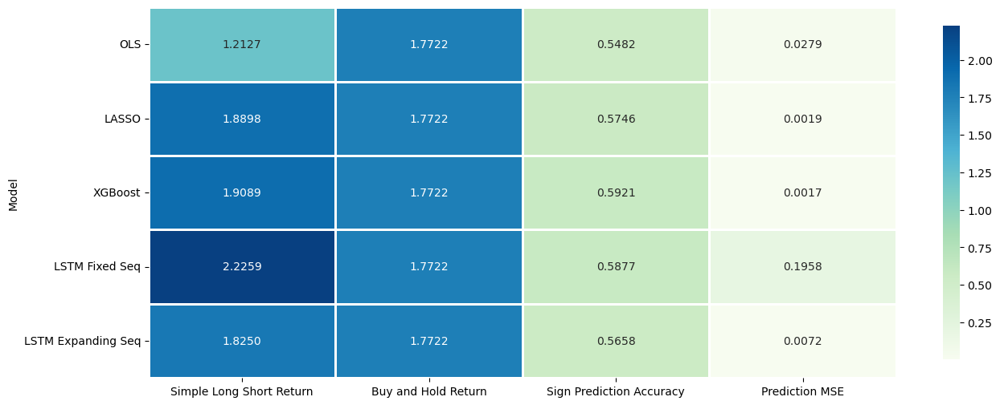

In [87]:
plt.figure(figsize=(15, 6))

sns.heatmap(
    overall_performance_df.astype(float), 
    annot=True,     
    cmap='GnBu', 
    fmt='.4f',      
    linewidths=.9,  
    cbar_kws={"shrink": .9} #  kwargs for the colorbar size
)
plt.xticks(rotation=0, ha='center') 
plt.yticks(rotation=0) 

plt.show()

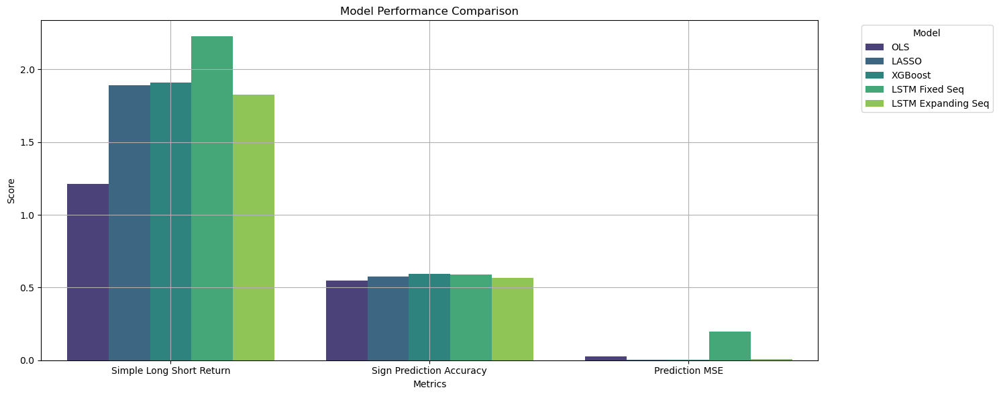

In [88]:
overall_performance_df_melted = overall_performance_df.reset_index()[
    [
        "Model",
        "Simple Long Short Return",
        "Sign Prediction Accuracy",
        "Prediction MSE",
    ]
].melt(id_vars=["Model"], var_name="Metrics", value_name="Score")

plt.figure(figsize=(15, 6))

sns.barplot(
    x="Metrics",
    y="Score",
    hue="Model",
    data=overall_performance_df_melted,
    palette="viridis",
)

plt.title("Model Performance Comparison")
plt.xlabel("Metrics")
plt.ylabel("Score")
plt.legend(title="Model", bbox_to_anchor=(1.05, 1), loc="upper left")

plt.tight_layout()
plt.grid()
plt.show()

THE END